# <span style='color:SteelBlue'>P5 - Segmentez des clients d'un site e-commerce</span>

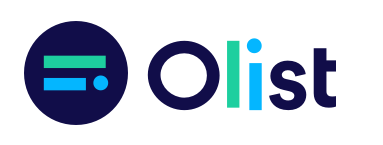

# <span class='bg-primary'>P5_02 - SEGMENTATION RFM</span>

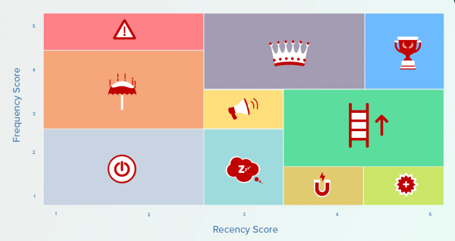


## <span style='background:Thistle'>Sommaire du notebook</span> 

In [1]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

## <span style='background:Thistle'>1. Introduction</span>

**Mission**
*****
Fournir aux équipes Marketing de l'entreprise Olist (site de e-commerce) une **segmentation des clients** utilisables dans leurs campagnes de communication.

**Objectifs**
*****
- **Comprendre** les différents **types d'utilisateurs** (comportements, données personnelles)
- **Fournir** une **description actionnable** de la segmentation avec une logique sous-jacente pour une optimisation optimale
- **Proposer** un **contrat de maintenance** basé sur une analyse de la stabilité des segments au cours du temps.

**Sources**
*****
- [Jeu de données](https://www.kaggle.com/olistbr/brazilian-ecommerce/code)

In [23]:
# Chargement des librairies
import jyquickhelper
from datetime import datetime
import datetime as dt
import numpy as np
import pandas as pd
import sys
from math import pi
import sklearn

# Pré processing
from sklearn.preprocessing import StandardScaler, PowerTransformer, \
    MinMaxScaler

# Clustering
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn import decomposition

# Librairies personnelles
import outils_data
import outils_visu
import outils_acp
import outils_segmentation

# Data visualisation
import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import squarify
# Plotly Libraries
import plotly
import plotly.express as px
import plotly.graph_objects as go

# Clustering Visualisation
from yellowbrick.cluster import KElbowVisualizer

# Warnings
import warnings
warnings.filterwarnings('ignore')

# initialize plotly for jupyter notebook
plotly.offline.init_notebook_mode()

%matplotlib inline
# Chargement à chaud des librairies personnelles
%load_ext autoreload
%autoreload 2
# Valide code pep8
%load_ext pycodestyle_magic
%pycodestyle_on
# %pycodestyle_off

# Versions
print('Version des librairies utilisées :')
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Matplotlib            : ' + mpl.__version__)
print('Seaborn               : ' + sns.__version__)
print('Sklearn               : ' + sklearn.__version__)
print('jyquickhelper         : ' + jyquickhelper.__version__)
print('Outils dataframe      : ' + outils_data.__version__)
print('Outils visualisation  : ' + outils_visu.__version__)
print('Outils acp            : ' + outils_acp.__version__)
print('Outils segmentation   : ' + outils_segmentation.__version__)

now = datetime.now().isoformat()
print('Lancé le           : ' + now)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The pycodestyle_magic extension is already loaded. To reload it, use:
  %reload_ext pycodestyle_magic
Version des librairies utilisées :
Python                : 3.8.8 (default, Feb 24 2021, 15:54:32) [MSC v.1928 64 bit (AMD64)]
NumPy                 : 1.19.5
Pandas                : 1.2.2
Matplotlib            : 3.3.4
Seaborn               : 0.11.0
Sklearn               : 0.23.2
jyquickhelper         : 0.4.220
Outils dataframe      : 0.0.2
Outils visualisation  : 0.0.2
Outils acp            : 0.0.1
Outils segmentation   : 0.0.0
Lancé le           : 2021-05-11T11:06:32.717371


In [24]:
dico_pd_option = {
    'display.max_rows': 400,
    'display.max_column': 200,
    'display.width': 100,
    'display.precision': 5,
    'display.max_colwidth': 200
}
for cle, val in dico_pd_option.items():
    pd.set_option(cle, val)

## <span style='background:Thistle'>2. Segmentation RFM - Quartiles</span>

- La **segmentation RFM** consiste à segmenter les clients en fonction de leur **comportement d’achat**. 
- Elle permet aux marketeurs de cibler des segments de clients avec des messages plus pertinents basés sur leurs comportements d’achat.
- C’est une **segmentation 100% comportementale**. On ne segmente pas  les clients en fonction de ce qu’ils sont (genre, sexe, ville, catégorie socio-professionnelle…), ni en fonction de ce qu’ils aiment (centres d’intérêt, goûts), mais **en fonction de ce qu’ils achètent**. Le principe sous-jacent est simple : un client qui a acheté récemment, qui achète fréquemment et qui génère beaucoup de chiffre d’affaires commandera à nouveau, à coup quasiment sûr. Les chances de se tromper sont très faibles. 
- La segmentation RFM repose sur ces 3 critères : 
    - **Récence** : date du dernier achat ou dernier contact client,
    - **Fréquence** : fréquence des achats sur une période de référence donnée,
    - **Montant** : somme des achats cumulés sur cette période.

Le **workflow RFM** est :

- **1.** **Recueil des données** disponibles au niveau de la transaction ou du client. Les données doivent inclure le numéro de client unique, la date de la transaction oude l'achat et le montant de la commande. 
- **2.** Créer un **dataframe RFM** qui résume les données pour calculer la récence (jours depuis la dernière transaction), la fréquence (nombre de transactions) et la valeur monétaire (montant total de la commande) au niveau du client.
- **3.** Établir un **score RFM** en trouvant la distribution de la récence, de la fréquence et de la valeur monétaire, et créez les scores en répartissant les valeurs dans des cases (plusieurs méthodes existent : en découpant par tranche (pd.qut), en utilisant les quantiles ou les centiles, en utilisant K-means pour répartir chacune des variables RFM dans plusieurs groupes).
- **4.** Créer des **segments** en classant les **clients** en fonction des scores individuels de récence, de fréquence et de valeur monétaire. Les segments doivent définir clairement la nature des clients (visualisation, métriques...).

Les étapes **1.** et **2.** ont été réalisées lors de l'analyse des données dans le notebook P5_01_notebook_analyse.

### <span style='background:PowderBlue'>2.1. Chargement du jeu de données RFM</span>

In [25]:
# chargement du jeu de données sauvegardé dans le premier notebook
# P5_01_notebook_analyse
df_rfm = pd.read_csv('OLIST_data_RFM.csv')

In [5]:
# Taille : nombre de lignes/colonnes
nRow, nVar = df_rfm.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 91819 lignes et 4 variables.


In [6]:
# Contenu des 3 premières lignes
df_rfm.head(3)

,customer_unique_id,rfm_recence,rfm_frequence,rfm_montant
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19
2,0000f46a3911fa3c0805444483337064,537,1,86.22


In [7]:
# Résumé des variables
desc_rfm = outils_data.description_variables(df_rfm)
desc_rfm

,customer_unique_id,rfm_recence,rfm_frequence,rfm_montant
type,object,int64,int64,float64
nb_nan,0.0,0.0,0.0,0.0
%_nan,0.0,0.0,0.0,0.0
count,91819,91819.0,91819.0,91819.0
unique,91819,NaN,NaN,NaN
top,a46bfb27bf5b8a9d9f67cb036fb016b8,NaN,NaN,NaN
freq,1,NaN,NaN,NaN
mean,NaN,237.23372,1.23894,213.29489
std,NaN,152.57186,0.84803,648.40834
min,NaN,1.0,1.0,9.59


### <span style='background:PowderBlue'>2.2. Création du dataframe de segmentation RFM</span>

Nous allons regrouper les clients en fonction des valeurs RFM. 

***
<span style='background:PaleGreen'>**Segmentation RFM - Méthode des quartiles**</span>
***

Comme il s'agit de valeurs continues, nous pouvons également utiliser les valeurs quantiles et les diviser en 4 groupes.

In [26]:
# Création du datframe de segmentation RFM
df_segm_rfm = df_rfm.copy()

***
<span style='background:Moccasin'>**SEGMENTATION**</span>
***

In [27]:
# Utilisation de la méthode des quantiles
df_quantiles = df_segm_rfm.quantile(q=[0.25, 0.5, 0.75])
# Transformation en dictionnaire plus facile à utiliser
df_quantiles = df_quantiles.to_dict()

In [28]:
# Assignation des bins aux variables R, F, M
# ------------------------------------------------------------------------
df_segm_rfm['R'] = df_segm_rfm['rfm_recence'] \
    .apply(outils_segmentation.R_Score, args=('rfm_recence',
                                              df_quantiles))
df_segm_rfm['F'] = df_segm_rfm['rfm_frequence']. \
    apply(outils_segmentation.FM_Score, args=('rfm_frequence',
                                              df_quantiles))
df_segm_rfm['M'] = df_segm_rfm['rfm_montant'] \
    .apply(outils_segmentation.FM_Score, args=('rfm_montant',
                                               df_quantiles))

***Note*** :
***
- **Meilleur score de récence**   : 4 : le dernier achat est le plus récent.
- **Meilleur score de fréquence** : 4 : les achats sont les plus fréquents.
- **Meilleur score de montant**   : 4 : le montant le plus élevé donc client dépensier.     

### <span style='background:PowderBlue'>2.3. Score RFM</span>

***
<span style='background:Moccasin'>**SCORES RFM**</span>
***

In [29]:
# Concaténation des groupes R, F et M ==> segment du client
# ------------------------------------------------------------------------
df_segm_rfm['RFM_Segment'] = df_segm_rfm.apply(lambda x: str(x['R']) +
                                               str(x['F']) + str(x['M']),
                                               axis=1)

***Note*** :
***
- RFM_Segment = **444** : les **clients VIPs** champions les plus dépensiers, commandes récentes et fréquentes.
- RFM_Segment = **111** : les **clients perdus** qui n'ont commandé qu'une seule fois et ont peu dépensé.

In [30]:
# Calul du score
# ------------------------------------------------------------------------
df_segm_rfm['RFM_Score'] = df_segm_rfm[['R', 'F', 'M']].sum(axis=1)
df_segm_rfm.head()

,customer_unique_id,rfm_recence,rfm_frequence,rfm_montant,R,F,M,RFM_Segment,RFM_Score
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,4,1,3,413,8
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,3,1,1,311,5
2,0000f46a3911fa3c0805444483337064,537,1,86.22,1,1,2,112,4
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,2,1,1,211,4
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,2,1,3,213,6


In [13]:
# Calcul de la moyenne de chacune des variables RFM par RFM_Score
# ------------------------------------------------------------------------
%pycodestyle_off
df_segm_rfm_agg = df_segm_rfm.groupby('RFM_Score').agg({
    'rfm_recence' : 'mean',
    'rfm_frequence' : 'mean',
    'rfm_montant' : ['mean', 'count']
})
display(df_segm_rfm_agg)
%pycodestyle_on

rfm_recence rfm_frequence rfm_montant       
                 mean          mean        mean  count
RFM_Score                                             
3           454.22333       1.00000    43.75474   5539
4           361.35128       1.00000    64.81804  10994
5           291.70232       1.00000    90.38095  16064
6           217.32479       1.01739   152.73866  19554
7           160.67467       1.05662   186.18223  14324
8           130.91826       1.15528   239.71059   9995
9           207.91119       1.76793   483.88474   6722
10          235.99577       2.57583   631.59220   3310
11          144.32724       2.60575   644.85968   2955
12           60.62870       2.74132   795.69859   2362

***
<span style='background:Moccasin'>**CLASSEMENT DES CLIENTS PAR SCORE**</span>
***

***Description***

| Groupe | Type de client | R | F | M | Description |
| --- | --- | --- | --- | --- | --- |
| 1 | VIPs Champions | 4 | 4 | 4 | Les meilleurs clients. Ces clients ont récemment fait un achat, ils achètent souvent et aussi les articles les plus chers / à prix élevé du magasin. |
| 2 | Clients fidèles | 3 ou 4 | 1 ou 2 | 3 ou 4 | Cette catégorie de clients n'a peut-être pas acheté très récemment, mais elle achète sûrement souvent, et ce, même pour des produits coûteux ou à prix élevé. |
| 3 | Fidélisation potentielle | 3 ou 4 | 1 ou 2 | 3 ou 4  | Les clients avec fidélisation potentielle, bien qu'ils n'achètent pas régulièrement, sont des acheteurs récents et dépensent un bon montant sur les achats de produits. |
| 4 | Nouveaux clients | 4 | 1 | 1 | Comme leur nom l'indique, ce sont les acheteurs les plus récents, qui ont acheté les articles les moins chers, et ce, une ou deux fois. |
| 5 | Clients prometteurs | 3 ou 4  | 1 ou 2 | 1 ou 2 | Ce segment de clients est celui qui a acheté récemment et qui a acheté les articles les moins chers |
| 6 | Clients ayant besoin d'attention | 1 ou 2 | 2 ou 3 | 2 ou 3 | Ces clients n'ont peut-être pas acheté récemment, mais ils ont dépensé un montant décent un certain nombre de fois. |
| 7 | Sur le point de dormir | 2 ou 3 | 1 ou 2 | 1 à 4 | Ce type de clients a acheté vos produits mais pas très récemment. De plus, ils n'achètent pas souvent et ne dépensent pas beaucoup. |
| 8 | En danger | 1 ou 2 | 3 ou 4 | 3 ou 4 | Ces clients ont acheté vos produits fréquemment, ont acheté des produits à prix élevé. Mais n'ont pas fait d'achat depuis longtemps. |
| 9 | VIPs à ne pas perdre | 3 | 4 | 4 | Ces clients étaient des acheteurs fréquents et achetaient les produits les plus chers, mais au fil du temps, ils ne reviennent plus. |
| 10 | VIPs en hibernation | 2 | 4 | 4 | Ces clients ont acheté des articles haut de gamme, une ou deux fois seulement, et ne sont jamais revenus. |
| 11 | Client en hibernation | 1 | 4 | 1 à 4 | Ces clients n'ont acheté que des articles bas de gamme, une ou deux fois seulement, et ne sont jamais revenus. |
| 12 | VIPs perdus | 1 | 4 | 4 | Comme le nom l'indique, vous avez presque perdu ces clients. Ils ne sont jamais revenus. De plus, ils achetaient auparavant des produits haut de gamme, et à peine une ou deux fois. |
| 13 | Clients perdus | 1 | 1 ou 2 | 1 | Comme le nom l'indique, vous avez presque perdu ces clients. Ils ne sont jamais revenus. De plus, ils achetaient auparavant des produits bas de gamme, et à peine une ou deux fois. |

In [31]:
# Ajout d'une variable RFM de classement du type de client
# ---------------------------------------------------------------------
score_1 = ['444']
score_2 = ['331', '332', '333', '334', '341', '342', '343', '431',
           '432', '433', '434', '441', '442', '443']
score_3 = ['313', '314', '323', '324', '413', '414', '423', '424']
score_4 = ['411']
score_5 = ['321', '322', '412', '421', '422']
score_6 = ['121', '122', '123', '124', '131', '132', '223', '224',
           '231', '232']
score_7 = ['211', '212', '213', '214', '221', '223', '311', '312']
score_8 = ['133', '134', '143', '233', '234', '241', '242', '243']
score_9 = ['344']
score_10 = ['244']
score_11 = ['141', '142']
score_12 = ['144']
score_13 = ['111', '112', '113', '114']
df_segm_rfm['RFM_Segm_Client'] = ['Vips Champions'
                                  if row in score_1
                                  else 'Client fidèle'
                                  if row in score_2
                                  else 'Fidélisation potentielle'
                                  if row in score_3
                                  else 'Nouveau client'
                                  if row in score_4
                                  else 'Client prometteur'
                                  if row in score_5
                                  else 'Client ayant besoin attention'
                                  if row in score_6
                                  else 'Client sur le point de dormir'
                                  if row in score_7
                                  else 'Client en danger'
                                  if row in score_8
                                  else 'VIP à ne pas perdre'
                                  if row in score_9
                                  else 'VIP en hibernation'
                                  if row in score_10
                                  else 'Client en hibernation'
                                  if row in score_11
                                  else 'VIP perdu'
                                  if row in score_12
                                  else 'Client perdu'
                                  if row in score_13
                                  else 'Autres'
                                  for row in df_segm_rfm['RFM_Segment']]

In [15]:
df_segm_rfm['RFM_Segm_Client'].unique().tolist()

['Fidélisation potentielle',
 'Client sur le point de dormir',
 'Client perdu',
 'VIP à ne pas perdre',
 'Client en danger',
 'VIP perdu',
 'Client fidèle',
 'Nouveau client',
 'Vips Champions',
 'Client prometteur',
 'VIP en hibernation',
 'Client en hibernation']

**Note** :
***
- Il manque le type de segment **'Client ayant besoin attention'**.

### <span style='background:PowderBlue'>2.4. Visualisation des différents segments de clients</span>

***
<span style='background:Moccasin'>**VISUALISATION DES CLIENTS PAR SCORE**</span>
***

**DIAGRAMME EN BAR**

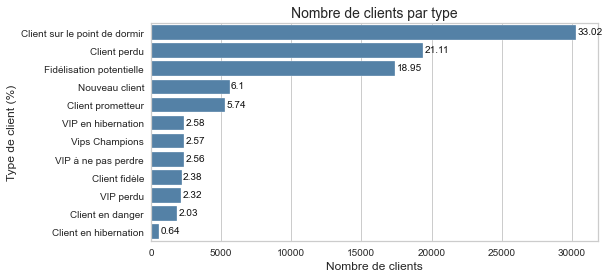

In [16]:
# Répartition des clients dans les différents types
# ---------------------------------------------------------------------
ax1 = plt.gca()

# DataFrame de travail
nb_client = df_segm_rfm['RFM_Segm_Client'].shape[0]
series_type_client = df_segm_rfm['RFM_Segm_Client'].value_counts()
df_visu_type_client = pd.DataFrame(
    {'Type_client': series_type_client.index,
     'Nb_clients': series_type_client.values})
df_visu_type_client['%'] = round(
    (df_visu_type_client['Nb_clients'])*100/nb_client, 2)

# Barplot de la distribution
sns.set_style('white')
sns.barplot(y='Type_client', x='Nb_clients',
            data=df_visu_type_client, color='SteelBlue', ax=ax1)
ax1.set_ylabel('Type de client (%)', fontsize=12)
ax1.set_xlabel('Nombre de clients', fontsize=12)
ax1.set_title('Nombre de clients par type', fontsize=14)
for i, p in enumerate(ax1.patches):
    ax1.text(
        p.get_width() +
        p.get_x() + 100,
        p.get_height() +
        p.get_y() - 0.3,
        df_visu_type_client['%'][i],
        fontsize=10,
        color='k')
plt.gcf().set_size_inches(8, 4)
plt.show()

In [17]:
# Pourcentage des différents types de client
df_visu_type_client.style.hide_index()

Type_client,Nb_clients,%
Client sur le point de dormir,30323,33.02000
Client perdu,19385,21.11000
Fidélisation potentielle,17397,18.95000
Nouveau client,5598,6.10000
Client prometteur,5273,5.74000
VIP en hibernation,2368,2.58000
Vips Champions,2362,2.57000
VIP à ne pas perdre,2346,2.56000
Client fidèle,2183,2.38000
VIP perdu,2133,2.32000


**TRACÉ RADAR**

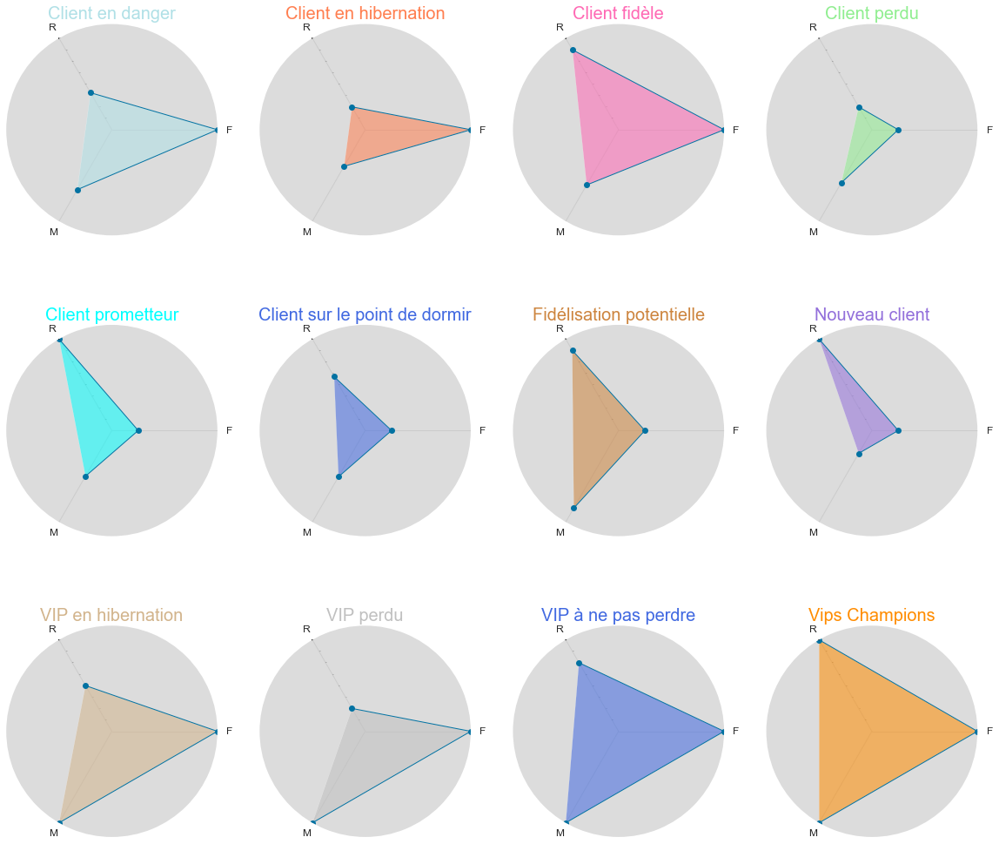

In [18]:
# Radarplot des différents types de client
# ---------------------------------------------------------------------

df_plot = df_segm_rfm.groupby('RFM_Segm_Client')[['R', 'F', 'M']].mean()
plt.rc('axes', facecolor='Gainsboro')

# number of variable
categories = list(df_plot.columns)

N = len(categories)

# What will be the angle of each axis in the plot? (we divide the plot /
# number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]


fig = plt.figure(1, figsize=(20, 18))

colors = ['PowderBlue', 'Coral', 'HotPink', 'LightGreen', 'Cyan',
          'RoyalBlue', 'Peru', 'MediumPurple', 'Tan', 'Silver',
          'RoyalBlue', 'DarkOrange']

for i, region in enumerate(df_plot.index):

    ax = fig.add_subplot(3, 4, i+1, polar=True)

    ax.set_theta_offset(2*pi/3)
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(0)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles, categories, size=10)
    plt.yticks(color="grey", size=2)
    values = df_plot.iloc[i].values
    ax.plot(angles, values, 'o-', linewidth=1, linestyle='solid')
    ax.fill(angles, values, colors[i], alpha=0.55)
    ax.set_xticks(angles)
    ax.set_xticklabels(categories, fontsize=12)
    ax.set_title(region, size=20, color=colors[i])
    ax.grid(True)
    plt.grid(True)
    plt.ylim(0, 4)

plt.show()

**PAIR PLOT**

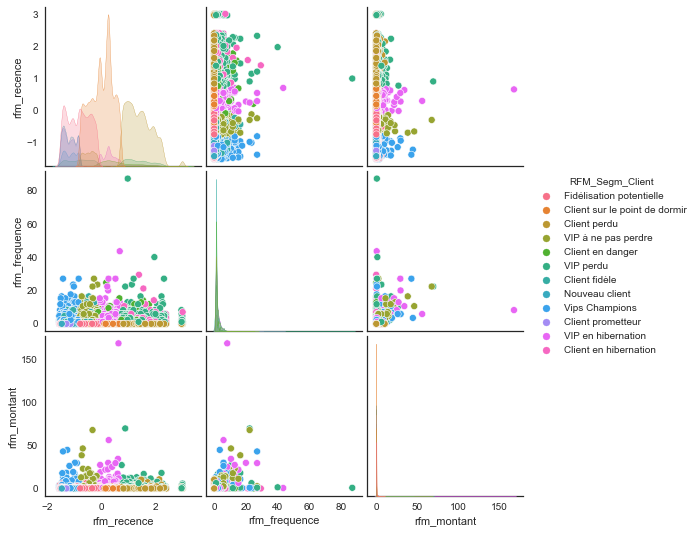

In [19]:
# Pairplot des différents types de client
# ---------------------------------------------------------------------
# Standardisation pour répartir également le poids de variables RFM
df_rfm_pairplot = df_segm_rfm.copy()

scaler = StandardScaler()
df_rfm_pairplot['rfm_recence'] = scaler.fit_transform(
    df_rfm_pairplot['rfm_recence'].values.reshape(-1, 1))
df_rfm_pairplot['rfm_frequence'] = scaler.fit_transform(
    df_rfm_pairplot['rfm_frequence'].values.reshape(-1, 1))
df_rfm_pairplot['rfm_montant'] = scaler.fit_transform(
    df_rfm_pairplot['rfm_montant'].values.reshape(-1, 1))

sns.set_style('white')
sns.pairplot(df_rfm_pairplot,
             vars=['rfm_recence', 'rfm_frequence', 'rfm_montant'],
             hue="RFM_Segm_Client")
plt.show()

**Boxplot**

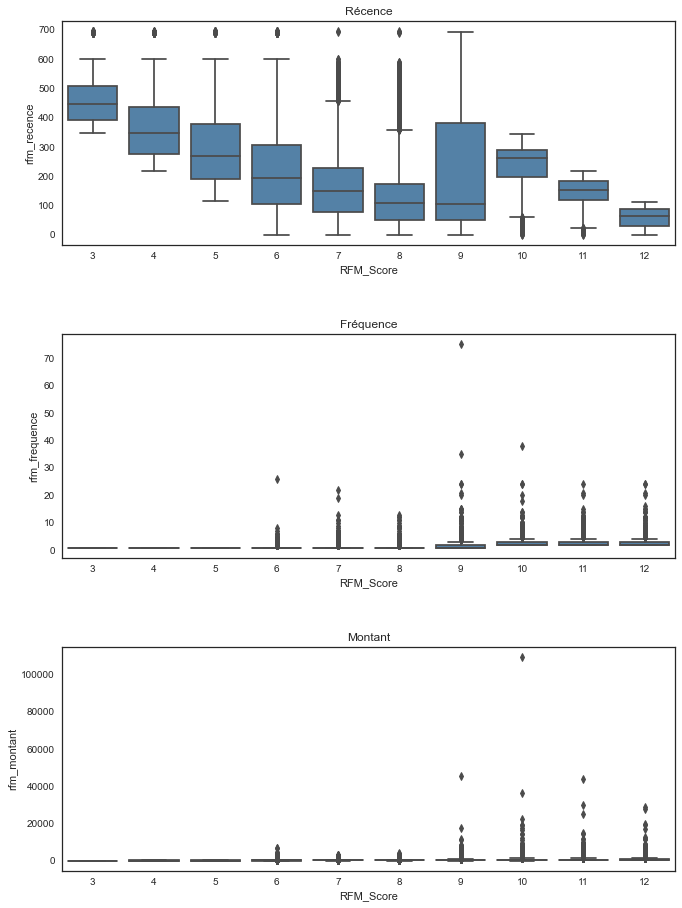

In [20]:
# Boîte à moustache des types de client
# --------------------------------------------------------------------
fig, axs = plt.subplots(3, 1)
fig.subplots_adjust(left=0.08, right=1.5, bottom=0.05,
                    top=3, hspace=0.4, wspace=0.3)

# Boxplot Récence
sns.boxplot(x='RFM_Score', y='rfm_recence', data=df_segm_rfm,
            color='SteelBlue', ax=axs[0])
axs[0].set_title('Récence')

# Boxplot Fréquence
sns.boxplot(x='RFM_Score', y='rfm_frequence', data=df_segm_rfm,
            color='SteelBlue', ax=axs[1])
axs[1].set_title('Fréquence')

# Boxplot Montant
sns.boxplot(x='RFM_Score', y='rfm_montant', data=df_segm_rfm,
            color='SteelBlue', ax=axs[2])
axs[2].set_title('Montant')

plt.show()

**Squarify plot**

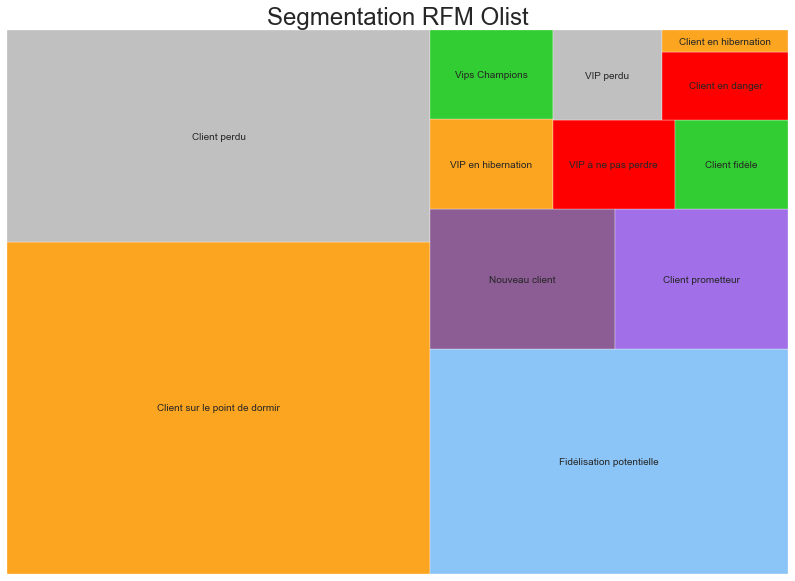

In [21]:
# Squarify plot des types de client
# --------------------------------------------------------------------
# colors = ['#248af1', '#eb5d50', '#8bc4f6', '#8c5c94', '#a170e8',
#           '#fba521', '#75bc3f', 'green', 'red', '#eb5d50', 'blue', 'pink']

colors = ['#fba521', 'Silver', '#8bc4f6', '#8c5c94', '#a170e8',
          '#fba521', '#32CD32', '#FF0000', '#32CD32', 'Silver', '#FF0000',
          '#fba521']
# Dataframe de travail
df_quarify_plot = \
    df_segm_rfm.groupby('RFM_Segm_Client')['customer_unique_id'].nunique() \
    .sort_values(ascending=False).reset_index()
# Valeur mini and maxi
mini = min(df_quarify_plot['customer_unique_id'])
maxi = max(df_quarify_plot['customer_unique_id'])
# Trouver des couleurs pour chaque segment
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
# Plotting
fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(14, 10)
squarify.plot(sizes=df_quarify_plot['customer_unique_id'],
              label=df_quarify_plot.RFM_Segm_Client, alpha=1,
              color=colors)
# Supprimer l'axe
plt.axis('off')
# Title
plt.title("Segmentation RFM Olist", fontsize=24)
# Title Positioning
ttl = ax.title
ttl.set_position([.5, 1.05])
plt.show()

***
<span style='background:Moccasin'>**CLASSEMENT DES CLIENTS PAR NIVEAU : Or, Argent, Bronze...**</span>
***

In [32]:
# Ajouter une variable de tri du patient
df_segm_rfm['RFM_Niveau'] = ['Diamant' if row >= 11
                             else 'Platine' if (row <= 10 and row >= 9)
                             else 'Argent' if (row <= 8 and row >= 7)
                             else 'Bronze'
                             for row in df_segm_rfm['RFM_Score']]

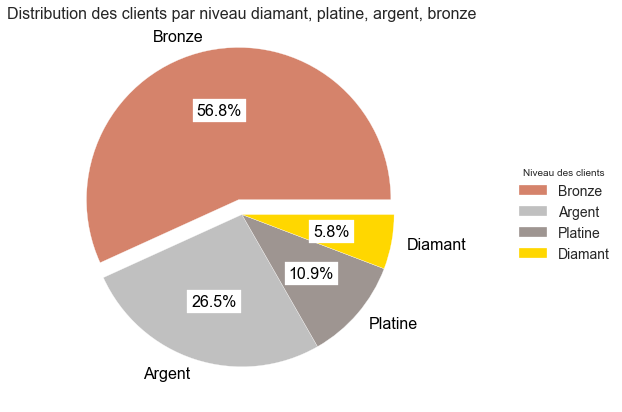

In [24]:
# Pieplot de représentation des clients par niveau
colors_niveau = ['#d5836b', '#C0C0C0', '#9e9591', 'Gold']
title = \
    'Distribution des clients par niveau diamant, platine, argent, bronze'
outils_visu.trace_pieplot(df_segm_rfm, 'RFM_Niveau', title,
                          'Niveau des clients', colors_niveau)

### <span style='background:PowderBlue'>2.5. Stratégies marketing possibles par segment</span>

***
<span style='background:Moccasin'>**STRATEGIES MARKETING SELON LES TYPES DE CLIENT**</span>
***

***
**1. VIPs Champions** :
***
- [X] ***Offrez des récompenses*** : Offrez-leur l'un de vos produits les plus populaires. Cela suscitera davantage de commandes de la part de ces clients à l'avenir.
- [X] ***Construisez votre crédibilité*** : Présentez ces clients partout où vous le pouvez, que ce soit sur la page des commentaires avec des témoignages ou sur les médias sociaux. Ils contribueront à promouvoir davantage votre marque.
***
**2. Clients fidèles** :
***
- [X] ***Prenez des retours d'information et des enquêtes*** : Demandez régulièrement l'avis de ces clients régulièrement pour savoir s'ils sont satisfaits ou non de vos produits. Cela vous aidera à savoir ce qu'ils attendent à l'avenir.
- [X] ***Faites des ventes incitatives de vos produits*** : Des études ont prouvé que les clients réguliers dépensent plus lors de leur prochain achat ! Vous pouvez donc leur vendre vos produits à un prix supérieur afin de réaliser des bénéfices supplémentaires.
- [X] ***Offrez des bonus*** : Offrir des bonus aux clients fidèles incite à acheter davantage. Par exemple, la livraison gratuite pendant une période limitée peut être l'un des bonus.

***
**3. Fidélisation potentielle** :
***
- [X] ***Proposez un programme de fidélité*** : Présentez-leur un programme de fidélité ou peut-être une adhésion à un club d'élite afin de ne pas les perdre.
- [X] ***Organisez des concours*** : Gardez ces clients dans la boucle en organisant des concours avec des prix attractifs.
- [X] ***Faites en sorte qu'ils se sentent spéciaux*** : Créez un lien avec ces clients en leur souhaitant un anniversaire, etc. CONSEIL - Offrez-leur une petite carte cadeau ou des points de récompense lors de ces journées spéciales.

***
**4. Nouveaux clients** :
***
- [X] ***Fournissez une aide à l'accueil*** : Guidez vos nouveaux clients à l'aide d'un kit d'accueil - courriel de bienvenue, guide des produits, etc.
- [X] ***Offrez-leur des remises*** : Accueillez vos nouveaux clients en leur offrant des points de réduction ou des coupons sur leur prochain achat pour les inciter à revenir.
- [X] ***Établissez une relation*** : Proposez votre aide à chaque étape. Répondez à leurs questions, demandez-leur leur avis pour éviter qu'ils ne se détournent de votre site.

***
**5. Clients prometteurs** :
***
- [X] ***Proposez un essai gratuit*** : Proposez-leur un essai gratuit à durée limitée avec des fonctionnalités haut de gamme de votre produit et laissez-les décider de l'achat après la période d'expiration.
- [X] ***Faites connaître votre marque*** : Si vous prévoyez d'organiser un événement, invitez ces clients à y participer en leur proposant une offre sur vos produits haut de gamme, mais pour une durée limitée. CONSEIL - Faites également la promotion de l'événement sur les médias sociaux afin de rallier les non-abonnés.
- [X] ***Proposez une annonce*** : si vous prévoyez une publicité, inscrivez ces clients et laissez-les promouvoir vos produits premium.

***
**6. Clients ayant besoin d'attention** :
***
- [X] ***Proposez des produits combinés*** : Passez en revue leurs achats passés et réfléchissez aux combinaisons de produits ou aux offres que vous pouvez leur proposer.
- [X] ***Soyez nostalgique*** : Présentez leurs anciens achats et proposez-leur des produits tendance pour une offre à durée limitée. CONSEIL - Connaissez les 5 principaux facteurs qui influencent le comportement d'achat des clients.
- [X] ***Faites une farce*** : faites participer vos clients à une farce qui tourne autour de vos produits afin de maintenir leur intérêt pour vos produits. 

***
**7. Sur le point de dormir** :
***
- [X] ***Partagez des ressources précieuses*** : Faites-leur savoir comment vos produits sont utiles aux clients ou donnez-leur des liens utiles.
- [X] ***Donnez votre analyse de la concurrence*** : Faites savoir à vos clients en quoi vos produits sont bien meilleurs que ceux de vos concurrents.
- [X] ***Fournissez des mises à jour pertinentes*** : Fournissez-leur du contenu éducatif en rapport avec vos produits.

***
**8. En danger** :
***
- [X] ***Offrez un crédit*** : donnez-leur un certain montant de crédit sur leur achat. Ce type d'offre rend l'offre tangible et les clients sentent que cela en vaut la peine.
- [X] ***Proposez une liste de souhaits*** : Ces clients ajoutent des produits à leur liste de souhaits et suivent les offres sur ces produits. Organisez une vente en fonction de leur liste de souhaits de temps en temps.
- [X] ***Offres de mise à niveau*** : Tous les clients aiment les mises à niveau gratuites. C'est le meilleur moyen de les fidéliser.

***
**9. VIPs à ne pas perdre** :
***
- [X] ***Services sur mesure*** : De nombreux clients s'adaptent aux offres de l'entreprise. Ciblez ces clients en leur proposant des offres sur mesure.
- [X] ***Passez un appel téléphonique*** : Appelez-les personnellement pour connaître la raison pour laquelle ils n'ont pas effectué d'achat. Découvrez ce qui les a rendus
réticents à acheter.
- [X] ***Connectez-vous sur les médias sociaux*** : Restez en contact avec eux par le biais des médias sociaux et tenez-les informés des nouveaux lancements et des nouvelles offres. 1

***
**10/11. VIPs / Client en hibernation** :
***
- [X] ***Décidez si vous voulez qu'il revienne*** : S'il a été difficile de travailler avec le client, il est toujours préférable de le laisser partir. La dernière chose que vous pouvez faire est de vous assurer que vos clients ont une bonne expérience avant de partir.
- [X] ***Passez en revue votre produit*** : La plupart des clients peuvent partir parce qu'ils ne sont pas satisfaits du produit. Consultez les avis sur différents sites pour comprendre la véritable raison.
- [X] ***Envoyez une campagne personnalisée*** : Montrez que vous vous souciez d'eux et prévoyez des offres avec des codes de réduction personnalisés.

***
**12/13. VIPs / Clients perdus** :
***
- [X] ***Comprenez-les*** : Faites des recherches sur vos clients perdus afin d'élaborer une stratégie pour les faire revivre.
- [X] ***Faites une dernière promotion*** : Envoyez un e-mail de promotion qui dit par exemple : "Vous nous manquez. Voici votre cadeau : obtenez 25 % de réduction sur l'ensemble de votre commande."
- [X] ***Ignorez-les complètement*** : C'est la dernière chose que vous pouvez faire. Il est fort probable que ce type de clients ne reviendra pas. Dans ce cas, ce sera une perte de temps et d'argent pour l'entreprise.

[Source](https://www.coursehero.com/file/55227132/RFM-Analysis-11-customer-segments-compressedpdf/)

## <span style='background:Thistle'>3. Segmentation RFM - K-Means</span>

Nous allons utiliser K-Means pour effectuer le découpage de nos clients en groupe.

***
<span style='background:PaleGreen'>**Segmentation RFM -K-Means**</span>
***

In [33]:
# Création du datframe de segmentation RFM avec K-Means
df_segm_rfm_kmeans = df_segm_rfm.copy()

Comme il s'agit de valeurs continues, nous pouvons également utiliser les valeurs quantiles et les diviser en 4 groupes.

In [34]:
df_segm_rfm_kmeans = df_segm_rfm_kmeans.set_index('customer_unique_id')
df_segm_rfm_kmeans.head()

,rfm_recence,rfm_frequence,rfm_montant,R,F,M,RFM_Segment,RFM_Score,RFM_Segm_Client,RFM_Niveau
customer_unique_id,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,4,1,3,413,8,Fidélisation potentielle,Argent
0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,3,1,1,311,5,Client sur le point de dormir,Bronze
0000f46a3911fa3c0805444483337064,537,1,86.22,1,1,2,112,4,Client perdu,Bronze
0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,2,1,1,211,4,Client sur le point de dormir,Bronze
0004aac84e0df4da2b147fca70cf8255,288,1,196.89,2,1,3,213,6,Client sur le point de dormir,Bronze


***
<span style='background:Moccasin'>**Pré-processing**</span>
***

In [27]:
# Valeurs négatives ?
df_segm_rfm_kmeans[['rfm_recence', 'rfm_frequence', 'rfm_montant']] \
    .describe()

,rfm_recence,rfm_frequence,rfm_montant
count,91819.00000,91819.00000,91819.00000
mean,237.23372,1.23894,213.29489
std,152.57186,0.84803,648.40834
min,1.00000,1.00000,9.59000
25%,114.00000,1.00000,63.89500
50%,218.00000,1.00000,112.99000
75%,346.00000,1.00000,203.10500
max,695.00000,75.00000,109312.64000


Pas de valeurs négatives et toutes les valeurs sont supérieures à 0 ==> on peut transformer en log.

In [35]:
# Transformer les valeurs en logarithme pour que chaque variable aie
# le même poids
cols_preproc = ['rfm_recence', 'rfm_frequence', 'rfm_montant']
df_rfm_log = df_segm_rfm_kmeans[cols_preproc].apply(np.log, axis=1)
df_rfm_pow = df_segm_rfm_kmeans[cols_preproc]

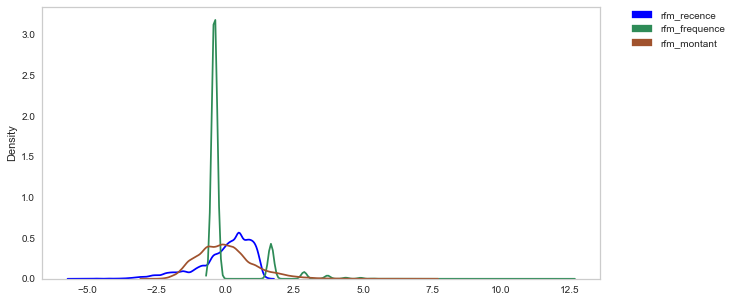

In [36]:
# Standardisation StandardScaler
# -----------------------------------------------------------------------
scaler = StandardScaler()
df_rfm_scaled = scaler.fit_transform(df_rfm_log)
# Dataframe
df_rfm_scaled = pd.DataFrame(df_rfm_scaled, index=df_segm_rfm_kmeans.index,
                             columns=df_rfm_log.columns)
# Visualisation
outils_visu.plot_graph(df_rfm_scaled)

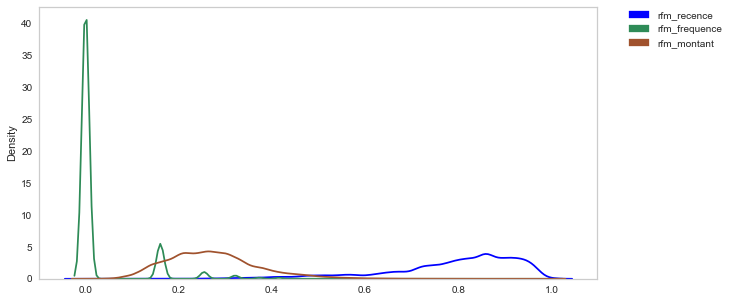

In [37]:
# Standardisation MinMaxScaler
# -----------------------------------------------------------------------
scaler_min = MinMaxScaler()
df_rfm_scaled_min = scaler_min.fit_transform(df_rfm_log)
# Dataframe
df_rfm_scaled_min = pd.DataFrame(df_rfm_scaled_min,
                                 index=df_segm_rfm_kmeans.index,
                                 columns=df_rfm_log.columns)
# Visualisation
outils_visu.plot_graph(df_rfm_scaled_min)

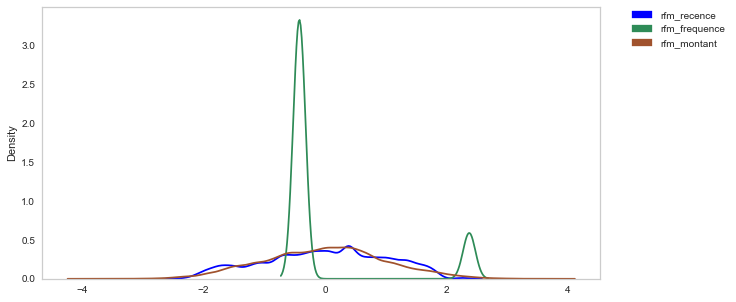

In [38]:
# Standardisation PowerTransformer box-cox
# -----------------------------------------------------------------------
scaler_pow = PowerTransformer(method='box-cox')
df_rfm_scaled_pow = scaler_pow.fit_transform(df_rfm_pow)
# Dataframe
df_rfm_scaled_pow = pd.DataFrame(df_rfm_scaled_pow,
                                 index=df_segm_rfm_kmeans.index,
                                 columns=df_rfm_log.columns)
# Visualisation
outils_visu.plot_graph(df_rfm_scaled_pow)

***
<span style='background:Moccasin'>**Recherche du meilleur hyper-paramètre k**</span>
***

**Méthode Elbow**

***Avec données standardisées avec StandardScaler***

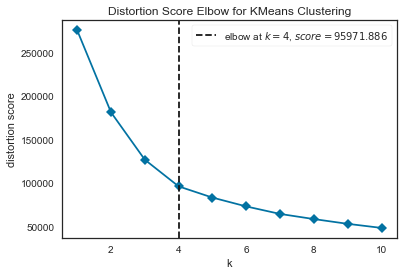

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [32]:
# Instanciation du modèle
model = KMeans()

# Hyperparamètre k entre 1 et 11
# métrique = distortion ( calcule la somme des distances au carré entre
# chaque point et le centre qui lui est attribué)
visualizer = KElbowVisualizer(model, k=(1, 11), timings=False)

# Entraîne le modèle
visualizer.fit(df_rfm_scaled)
visualizer.show()

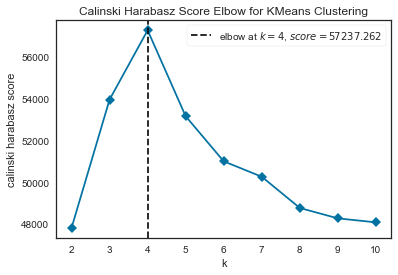

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [33]:
# Instanciation du modèle
model = KMeans()

# Hyperparamètre k entre 1 et 11
# métrique = calinski_harabasz (calcule le rapport de dispersion entre
# et au sein des clusters)
visualizer = KElbowVisualizer(model, k=(2, 11),
                              metric='calinski_harabasz', timings=False)

# Entraîne le modèle
visualizer.fit(df_rfm_scaled)
visualizer.show()

- La valeur du meilleur hyperparamètre k est '4'.

***Avec données standardisées avec MinMaxScaler***

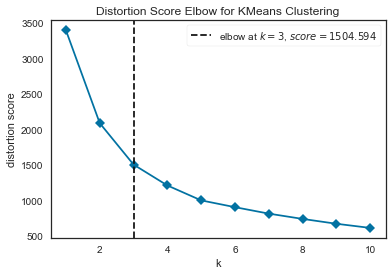

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [34]:
# Instanciation du modèle
model = KMeans()

# Hyperparamètre k entre 1 et 11
# métrique = distortion ( calcule la somme des distances au carré entre
# chaque point et le centre qui lui est attribué)
visualizer = KElbowVisualizer(model, k=(1, 11), timings=False)

# Entraîne le modèle
visualizer.fit(df_rfm_scaled_min)
visualizer.show()

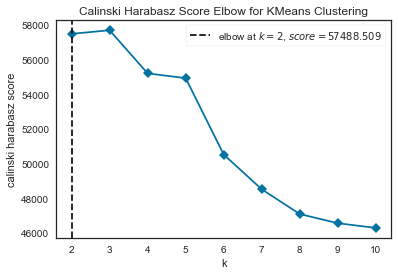

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [35]:
# Instanciation du modèle
model = KMeans()

# Hyperparamètre k entre 1 et 11
# métrique = calinski_harabasz (calcule le rapport de dispersion entre
# et au sein des clusters)
visualizer = KElbowVisualizer(model, k=(2, 11),
                              metric='calinski_harabasz', timings=False)

# Entraîne le modèle
visualizer.fit(df_rfm_scaled_min)
visualizer.show()

- La valeur du meilleur hyperparamètre k est difficile à trouver et le coude est moins évident qu'avec StandardScaler : '3' ou '4'.

***Avec données standardisées avec PowerTransformer***

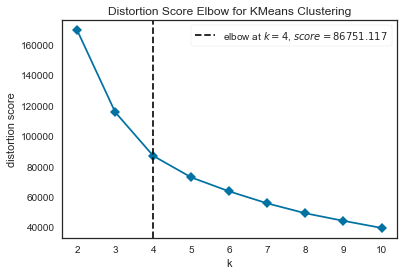

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [36]:
# Instanciation du modèle
model = KMeans()

# Hyperparamètre k entre 1 et 11
# métrique = distortion ( calcule la somme des distances au carré entre
# chaque point et le centre qui lui est attribué)
visualizer = KElbowVisualizer(model, k=(2, 11), timings=False)

# Entraîne le modèle
visualizer.fit(df_rfm_scaled_pow)
visualizer.show()

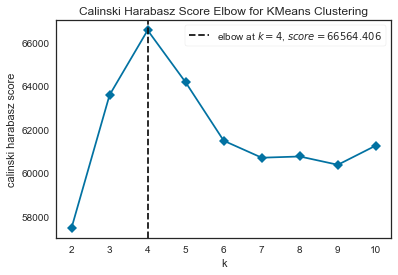

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [37]:
# Instanciation du modèle
model = KMeans()

# Hyperparamètre k entre 1 et 11
# métrique = calinski_harabasz (calcule le rapport de dispersion entre
# et au sein des clusters)
visualizer = KElbowVisualizer(model, k=(2, 11),
                              metric='calinski_harabasz', timings=False)

# Entraîne le modèle
visualizer.fit(df_rfm_scaled_pow)
visualizer.show()

- La valeur du meilleur hyperparamètre k est '4' comme StandardScaler.

**Clustering**

***Avec données standardisées avec StandardScaler***

In [39]:
# Clustering avec k=4 comme meilleur hyperparamètre
clus = KMeans(n_clusters=4, init='k-means++', max_iter=300)
clus.fit(df_rfm_scaled)

KMeans(n_clusters=4)

In [40]:
# AJout du groupe de cluster au jeu de données
df_segm_rfm['K_Cluster'] = clus.labels_
df_segm_rfm_kmeans['K_Cluster'] = clus.labels_
cluster_labels = clus.labels_

***Avec données standardisées avec PowerTransformer***

In [41]:
# Clustering avec k=4 comme meilleur hyperparamètre
clus_pow = KMeans(n_clusters=4, init='k-means++', max_iter=300)
clus_pow.fit(df_rfm_scaled_pow)

KMeans(n_clusters=4)

In [42]:
# Ajout du groupe de cluster au jeu de données
df_segm_rfm['K_pow_Cluster'] = clus_pow.labels_
df_segm_rfm_kmeans['K_pow_Cluster'] = clus_pow.labels_
cluster_labels_pow = clus_pow.labels_

***
<span style='background:Moccasin'>**Comparaison RFM quartiles et K-Means**</span>
***

In [43]:
# Constitution du dataframe de travail données StandardScaler
# --------------------------------------------------------------------
# Ajout de la colonne de cluster
df_rfm_scaled['K_Cluster'] = clus.labels_
df_rfm_scaled['RFM_Niveau'] = df_segm_rfm_kmeans['RFM_Niveau']
df_rfm_scaled['RFM_Segm_Client'] = df_segm_rfm_kmeans['RFM_Segm_Client']
df_rfm_scaled.reset_index(inplace=True)

# Melt du dataframe
df_rfm_melted = pd.melt(frame=df_rfm_scaled,
                        id_vars=['customer_unique_id', 'RFM_Niveau',
                                 'RFM_Segm_Client', 'K_Cluster'],
                        var_name='Metrics', value_name='Value')
df_rfm_melted.sort_values(by='Metrics', inplace=True)
df_rfm_melted.head()

,customer_unique_id,RFM_Niveau,RFM_Segm_Client,K_Cluster,Metrics,Value
137728,7fc2c4ada93f4c4569f60fcd436a97a9,Bronze,Client sur le point de dormir,2,rfm_frequence,-0.38768
122420,5517d61ee1936e47fb4f9de281d370e8,Bronze,Nouveau client,0,rfm_frequence,-0.38768
122421,55187363d85f30f921a418a1c5563832,Argent,Client prometteur,3,rfm_frequence,-0.38768
122422,5518a112dff474788c0d52cd4688acff,Platine,VIP en hibernation,1,rfm_frequence,1.66067
122423,5519d48c02e36392f44e56019db3b34d,Bronze,Client perdu,0,rfm_frequence,-0.38768


In [44]:
# Constitution du dataframe de travail données PowerTransformer
# --------------------------------------------------------------------
# Ajout de la colonne de cluster
df_rfm_scaled_pow['K_pow_Cluster'] = clus_pow.labels_
df_rfm_scaled_pow['RFM_Niveau'] = df_segm_rfm_kmeans['RFM_Niveau']
df_rfm_scaled_pow['RFM_Segm_Client'] = df_segm_rfm_kmeans['RFM_Segm_Client']
df_rfm_scaled_pow.reset_index(inplace=True)

# Melt du dataframe
df_rfm_melted_pow = pd.melt(frame=df_rfm_scaled_pow,
                            id_vars=['customer_unique_id', 'RFM_Niveau',
                                     'RFM_Segm_Client', 'K_pow_Cluster'],
                            var_name='Metrics', value_name='Value')
df_rfm_melted_pow.sort_values(by='Metrics', inplace=True)
df_rfm_melted_pow.head()

,customer_unique_id,RFM_Niveau,RFM_Segm_Client,K_pow_Cluster,Metrics,Value
137728,7fc2c4ada93f4c4569f60fcd436a97a9,Bronze,Client sur le point de dormir,1,rfm_frequence,-0.42134
122420,5517d61ee1936e47fb4f9de281d370e8,Bronze,Nouveau client,2,rfm_frequence,-0.42134
122421,55187363d85f30f921a418a1c5563832,Argent,Client prometteur,3,rfm_frequence,-0.42134
122422,5518a112dff474788c0d52cd4688acff,Platine,VIP en hibernation,0,rfm_frequence,2.36914
122423,5519d48c02e36392f44e56019db3b34d,Bronze,Client perdu,1,rfm_frequence,-0.42134


**Snake plot**

<span style='background:PaleTurquoise'>**Niveau des clients : Diamant, platine, argent ou bronze**</span>

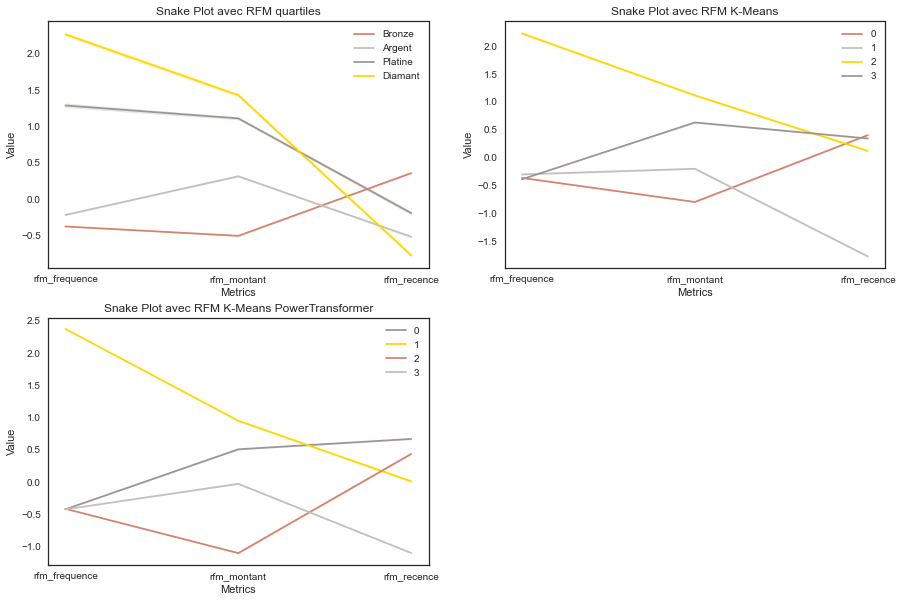

In [150]:
# Niveau des clients : Diamant, platine, argent ou bronze
# --------------------------------------------------------------------
# Visualisation : Snake plot de comparaison méthode quartiles/K-Means
# --------------------------------------------------------------------

plt.figure(figsize=(15, 10))

sns.set_style('white')

# Snake plot pour RFM quartiles
plt.subplot(2, 2, 1)
sns.lineplot(x='Metrics', y='Value', hue='RFM_Niveau',
             data=df_rfm_melted, palette=['#d5836b', '#C0C0C0',
                                          '#9e9591', 'Gold'])
plt.title('Snake Plot avec RFM quartiles')
plt.legend(loc='upper right')

# Snake plot avec RFM K-Means
plt.subplot(2, 2, 2)
sns.lineplot(x='Metrics', y='Value', hue='K_Cluster',
             data=df_rfm_melted, palette=['#d5836b', '#C0C0C0',
                                          'Gold', '#9e9591'])
plt.title('Snake Plot avec RFM K-Means')
plt.legend(loc='upper right')

# Snake plot avec RFM K-Means PowerTransfromer
plt.subplot(2, 2, 3)
sns.lineplot(x='Metrics', y='Value', hue='K_pow_Cluster',
             data=df_rfm_melted_pow, palette=['#9e9591', 'Gold',
                                              '#d5836b', '#C0C0C0'])
plt.title('Snake Plot avec RFM K-Means PowerTransformer')
plt.legend(loc='upper right')

plt.show()

- On retrouve les équivalences entre les groupes de cluster et les niveaux des clients :
    - [x] **Cluster 2** = **Cluster 1 powertransfo** = **Diamant**,
    - [x] **Cluster 3** = **Cluster 0 powertransfo** = **Platine**,
    - [x] **Cluster 1** = **Cluster 3 powertransfo** = **Argent**,
    - [x] **Cluster 0** = **Cluster 2 powertransfo** = **Bronze**.

<span style='background:PaleTurquoise'>**Niveau des 12 segments des clients**</span>

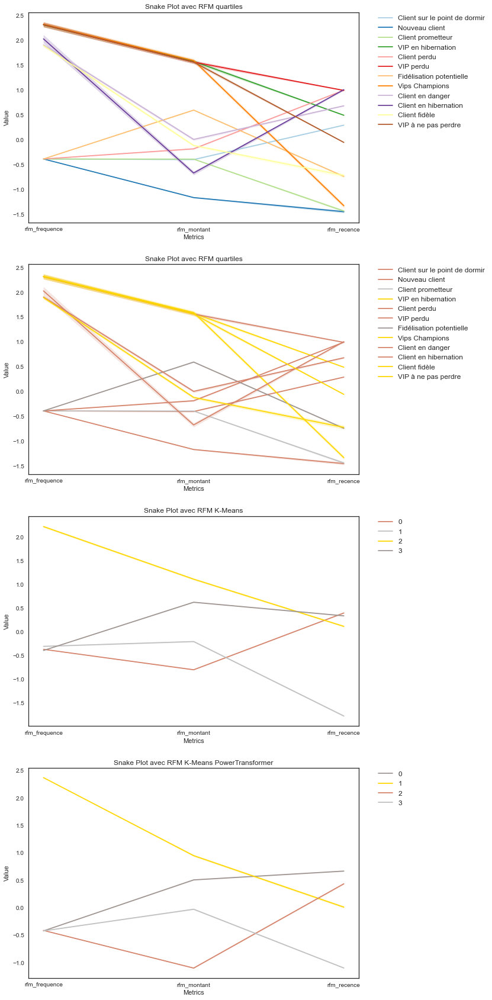

In [151]:
# Niveau des 12 segments clients : Client perdu, nouveau client, VIP...
# --------------------------------------------------------------------
# Visualisation : Snake plot de comparaison méthode quartiles/K-Means
# --------------------------------------------------------------------

plt.figure(figsize=(10, 30))

sns.set_style('white')

# Snake plot pour RFM quartiles
plt.subplot(4, 1, 1)
sns.lineplot(x='Metrics', y='Value', hue='RFM_Segm_Client',
             data=df_rfm_melted, palette='Paired')
plt.title('Snake Plot avec RFM quartiles')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,
           fontsize=12)

# Snake plot pour RFM quartiles avec couleurs de K-Means
plt.subplot(4, 1, 2)
sns.lineplot(x='Metrics', y='Value', hue='RFM_Segm_Client',
             data=df_rfm_melted, palette=['#d5836b', '#d5836b',
                                          '#C0C0C0', 'Gold',
                                          '#d5836b', '#d5836b',
                                          '#9e9591', 'Gold',
                                          '#d5836b', '#d5836b',
                                          'Gold', 'Gold'])
plt.title('Snake Plot avec RFM quartiles')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,
           fontsize=12)

# Snake plot avec RFM K-Means
plt.subplot(4, 1, 3)
sns.lineplot(x='Metrics', y='Value', hue='K_Cluster',
             data=df_rfm_melted, palette=['#d5836b', '#C0C0C0',
                                          'Gold', '#9e9591'])
plt.title('Snake Plot avec RFM K-Means')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,
           fontsize=12)

# Snake plot avec RFM K-Means PowerTransfromer
plt.subplot(4, 1, 4)
sns.lineplot(x='Metrics', y='Value', hue='K_pow_Cluster',
             data=df_rfm_melted_pow, palette=['#9e9591', 'Gold',
                                              '#d5836b', '#C0C0C0'])
plt.title('Snake Plot avec RFM K-Means PowerTransformer')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,
           fontsize=12)

plt.show()

**Heatmap**

In [152]:
# Niveau des clients : Diamant, platine, argent ou bronze
# --------------------------------------------------------------------
# Constitution du dataframe de travail
# --------------------------------------------------------------------

# Moyenne des variables
total_avg = df_segm_rfm_kmeans.iloc[:, 0:3].mean()

# RFM quartiles : niveau de client
# calcul de l'écart proportionnel avec la moyenne totale
cluster_avg = \
    df_segm_rfm_kmeans.groupby('RFM_Niveau').mean().iloc[:, 0:3]
prop_rfm = cluster_avg/total_avg - 1
prop_rfm = prop_rfm.loc[['Diamant', 'Platine', 'Argent', 'Bronze']]

# RFM quartiles : clients découpés en 12 segments
# calcul de l'écart proportionnel avec la moyenne totale
cluster_avg_seg = \
    df_segm_rfm_kmeans.groupby('RFM_Segm_Client').mean().iloc[:, 0:3]
prop_rfm_seg = cluster_avg_seg/total_avg - 1
liste_segm = ['Vips Champions', 'Client fidèle', 'VIP à ne pas perdre',
              'VIP en hibernation', 'VIP perdu',
              'Fidélisation potentielle', 'Client prometteur',
              'Nouveau client', 'Client en danger',
              'Client sur le point de dormir', 'Client en hibernation',
              'Client perdu']
prop_rfm_seg = prop_rfm_seg.loc[liste_segm]

# RFM K-Means : calcul de l'écart proportionnel avec la moyenne totale
cluster_avg_K = \
    df_segm_rfm_kmeans.groupby('K_Cluster').mean().iloc[:, 0:3]
prop_rfm_K = cluster_avg_K/total_avg - 1
prop_rfm_K = prop_rfm_K.loc[[2, 3, 1, 0]]

# RFM K-Means powertransfo : calcul de l'écart proportionnel avec
# la moyenne totale
cluster_avg_K_pow = \
    df_segm_rfm_kmeans.groupby('K_pow_Cluster').mean().iloc[:, 0:3]
prop_rfm_K_pow = cluster_avg_K_pow/total_avg - 1
prop_rfm_K_pow = prop_rfm_K_pow.loc[[1, 0, 3, 2]]

<span style='background:PaleTurquoise'>**Niveau des clients : Diamant, platine, argent ou bronze**</span>

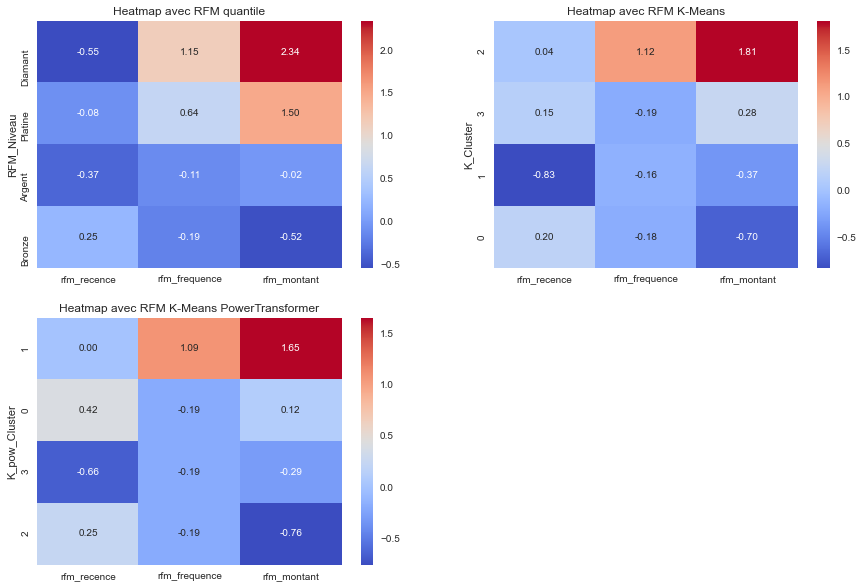

In [153]:
# Niveau des clients : Diamant, platine, argent ou bronze
# --------------------------------------------------------------------
# Visualisation : Heatmap de comparaison méthode quartiles/K-Means
# --------------------------------------------------------------------

plt.figure(figsize=(15, 10))

# Heatmap avec RFM quartiles
plt.subplot(2, 2, 1)
sns.heatmap(prop_rfm, cmap='coolwarm', fmt='.2f', annot=True)
plt.title('Heatmap avec RFM quantile')
plt.plot()

# heatmap avec RFM K-means
plt.subplot(2, 2, 2)
sns.heatmap(prop_rfm_K, cmap='coolwarm', fmt='.2f', annot=True)
plt.title('Heatmap avec RFM K-Means')
plt.plot()

# heatmap avec RFM K-means PowerTransformer
plt.subplot(2, 2, 3)
sns.heatmap(prop_rfm_K_pow, cmap='coolwarm', fmt='.2f', annot=True)
plt.title('Heatmap avec RFM K-Means PowerTransformer')
plt.plot()

plt.show()

- La répartition de la distribution semble également identique sauf pour les niveau Bronze qui contiennent plus de petits montant avec RFM K-Means qu'avec RFM quartiles.

<span style='background:PaleTurquoise'>**Niveau des 12 segments des clients**</span>

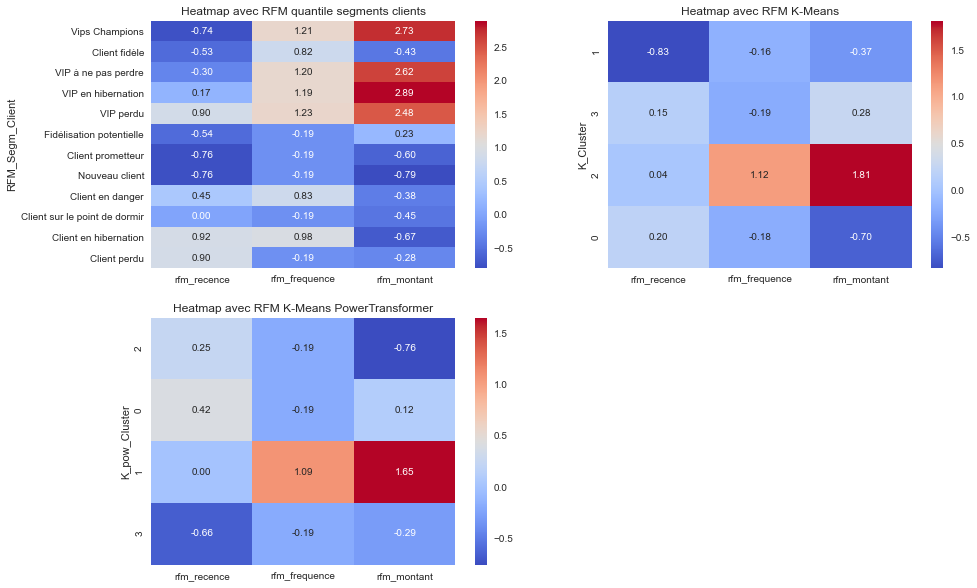

In [48]:
# Niveau des 12 segments clients : Client perdu, nouveau client, VIP...
# --------------------------------------------------------------------
# Visualisation : Heatmap de comparaison méthode quartiles/K-Means
# --------------------------------------------------------------------

plt.figure(figsize=(15, 10))

# Heatmap avec RFM quartiles
plt.subplot(2, 2, 1)
sns.heatmap(prop_rfm_seg, cmap='coolwarm', fmt='.2f', annot=True)
plt.title('Heatmap avec RFM quantile segments clients')
plt.plot()

# heatmap avec RFM K-means
plt.subplot(2, 2, 2)
sns.heatmap(prop_rfm_K, cmap='coolwarm', fmt='.2f', annot=True)
plt.title('Heatmap avec RFM K-Means')
plt.plot()

# heatmap avec RFM K-means PowerTransformer
plt.subplot(2, 2, 3)
sns.heatmap(prop_rfm_K_pow, cmap='coolwarm', fmt='.2f', annot=True)
plt.title('Heatmap avec RFM K-Means PowerTransformer')
plt.plot()

plt.show()

On retrouve bien les 4 groupes de clients :
- Diamant :
    - Vips Champions, 
    - Client fidèle, 
    - VIP à ne pas perdre,    
    - VIP en hibernation et VIP perdu ==> qui devraient en Bronze.
- Platine :
    - Fidélisation potentielle. 
- Argent :
    - Client prometteur,
    - Nouveau client, 
    - Client en danger,
    - Client sur le point de dormir, 
    - Client en hibernation,
    - Client perdu. 

**Visualisation des clusters en 2 dimensions**

**T-Sne**

<span style='background:PaleTurquoise'>**RFM K-Means StandardScaler**</span>

In [49]:
# Niveau des clients : Diamant, platine, argent ou bronze
# --------------------------------------------------------------------
# Initialise TSNE
df_plot = df_segm_rfm_kmeans[['rfm_recence', 'rfm_frequence',
                              'rfm_montant', 'K_Cluster']]
model = TSNE(random_state=1)
transformed = model.fit_transform(df_plot)

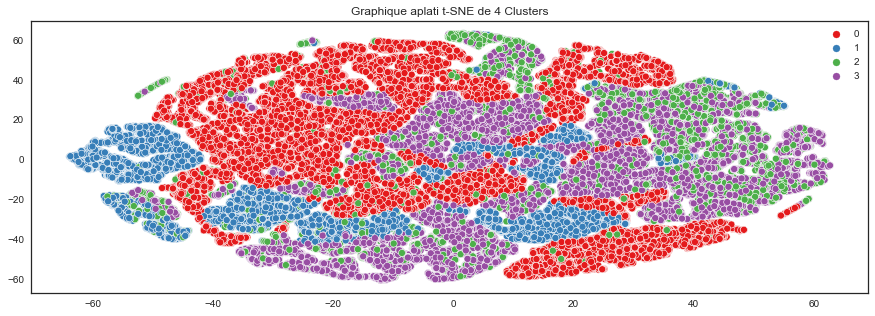

In [50]:
# Plot t-SNE
plt.figure(figsize=(15, 5))

plt.title('Graphique aplati t-SNE de 4 Clusters')
sns.scatterplot(x=transformed[:, 0], y=transformed[:, 1],
                hue=cluster_labels, palette='Set1')
plt.show()

- Les clusters 0 (Bronze) et 1 (Argent) sont relativement bien séparés.
- Mais les clusters 2 (Diamant) et 3 (Platine) sont mélangés.

<span style='background:PaleTurquoise'>**RFM K-Means PowerTransformer**</span>

In [54]:
# Niveau des clients : Diamant, platine, argent ou bronze
# --------------------------------------------------------------------
# Initialise TSNE
df_plot_pow = df_segm_rfm_kmeans[['rfm_recence', 'rfm_frequence',
                                  'rfm_montant', 'K_pow_Cluster']]
model = TSNE(random_state=1)
transformed_pow = model.fit_transform(df_plot_pow)

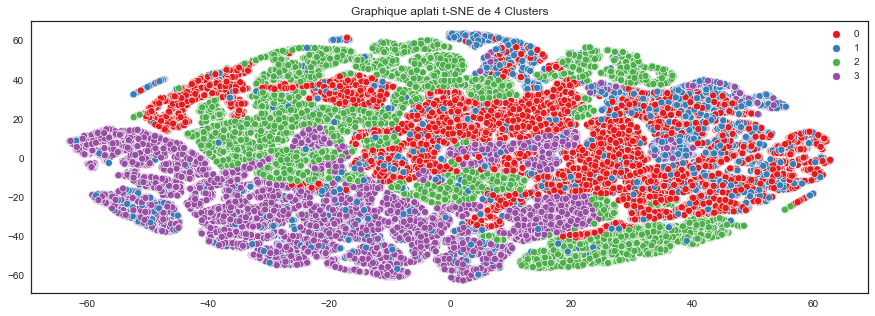

In [55]:
# Plot t-SNE
plt.figure(figsize=(15, 5))

plt.title('Graphique aplati t-SNE de 4 Clusters')
sns.scatterplot(x=transformed_pow[:, 0], y=transformed_pow[:, 1],
                hue=cluster_labels_pow, palette='Set1')
plt.show()

- Les clusters 0 (Bronze) et 3 (Argent) sont relativement bien séparés.
- Mais les clusters 1 (Diamant) et 2 (Platine) sont mélangés, les Diamants sont mélangés avec tous les autres clusters.

<span style='background:PaleTurquoise'>**RFM - Niveau des 12 segments des clients**</span>

In [154]:
# Niveau des 12 segments clients : Client perdu, nouveau client, VIP...
# --------------------------------------------------------------------
df_plot_segm = df_segm_rfm_kmeans[['rfm_recence', 'rfm_frequence',
                                   'rfm_montant', 'RFM_Segm_Client']]
# Encodage manuelle RFM_Segm_Client dans K_segm_client
df_plot_segm['K_segm_client'] = ['0' if row == 'Client en danger'
                                 else '1' if row == 'Client en hibernation'
                                 else '2' if row == 'Client fidèle'
                                 else '3' if row == 'Client perdu'
                                 else '4' if row == 'Client prometteur'
                                 else '5'
                                 if row == 'Client sur le point de dormir'
                                 else '6' if row == 'Fidélisation potentielle'
                                 else '7' if row == 'Nouveau client'
                                 else '8' if row == 'VIP en hibernation'
                                 else '9' if row == 'VIP perdu'
                                 else '10' if row == 'VIP à ne pas perdre'
                                 else '11' if row == 'Vips Champions'
                                 else '12'
                                 for row in df_plot_segm['RFM_Segm_Client']]
df_plot_segm.drop(columns=['RFM_Segm_Client'], inplace=True)

In [52]:
# Initialise TSNE
model = TSNE(random_state=1)
transformed_seg = model.fit_transform(df_plot_segm)

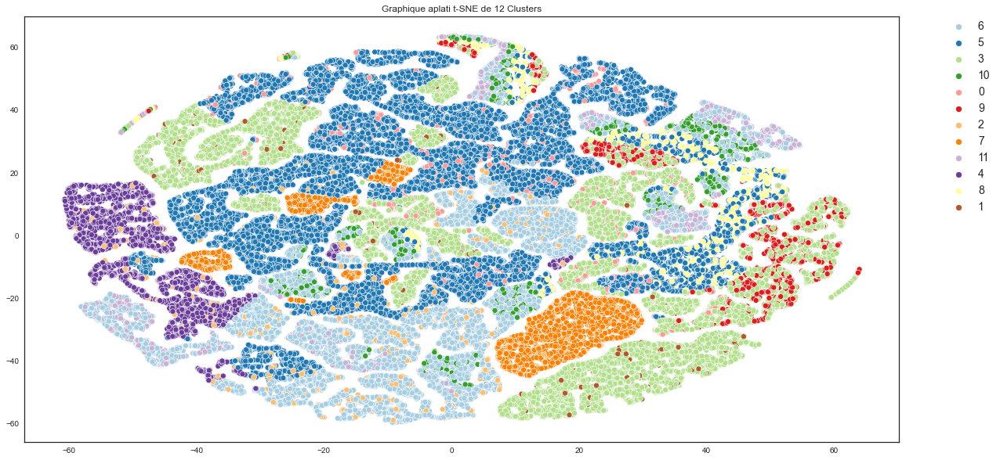

In [198]:
# Plot t-SNE
plt.figure(figsize=(20, 10))

sns.set_style('white')
palette = sns.color_palette('Paired', n_colors=12)

liste_k_seg = df_plot_segm['K_segm_client'].to_list()
plt.title('Graphique aplati t-SNE de 12 Clusters')
sns.scatterplot(x=transformed_seg[:, 0], y=transformed_seg[:, 1],
                hue=liste_k_seg, palette=palette)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,
           fontsize=14)
plt.show()

***Légende*** :
- **0** : Client en danger
- **1** : Client en hibernation
- **2** : Client fidèle
- **3** : Client perdu
- **4** : Client prometteur
- **5** : Client sur le point de dormir
- **6** : Fidélisation potentielle
- **7** : Nouveau client
- **8** : VIP en hibernation
- **9** : VIP perdu
- **10** : VIP à ne pas perdre
- **11** : Vips Champions

Les groupes sont bien séparés à l'exception des clients :
- 3-Clients perdus mélangés avec les clients :
    - 9-VIP perdus, 
    - et 1-Client en hibernation.
- 5-Client sur le point de dormir mélangés avec les clients :
    - 2-Client fidèle, 
    - et 8-VIP en hibernation.
- et les 7-Nouveau client mélangés avec les clients :
    - 6-Fidélisation potentielle.

**Réduction ACP**

***Données transformées avec StandardScaler***

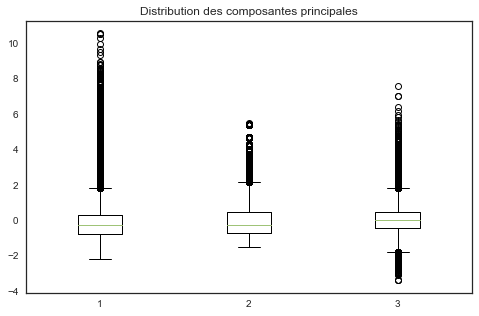

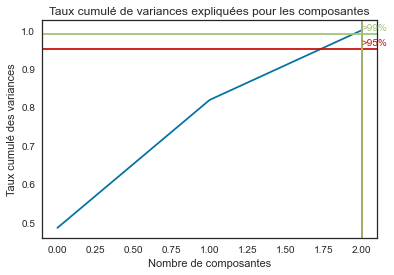

Nombre de composantes expliquant 95% de la variance : 2
Nombre de composantes expliquant 99% de la variance : 2


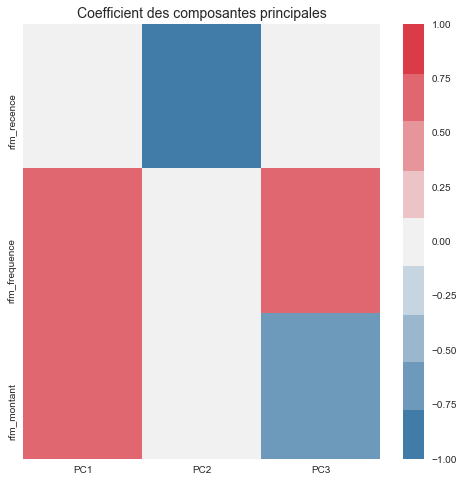

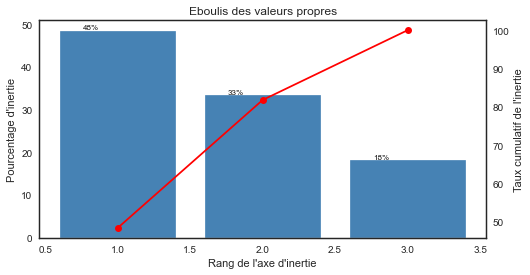

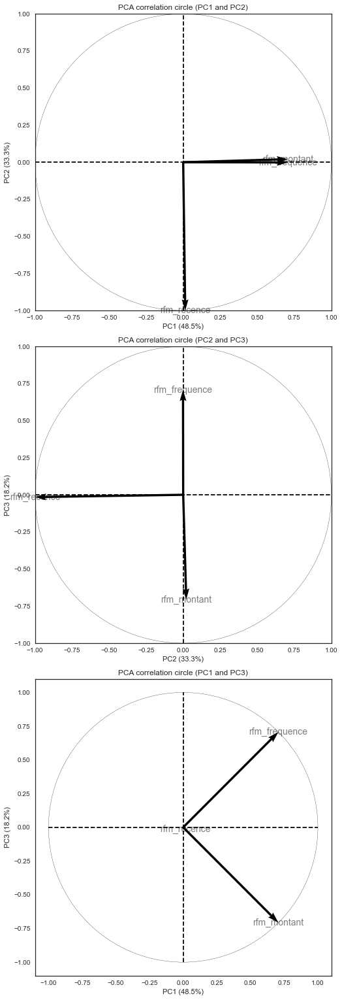

In [58]:
# Analyse en composante principale
df_acp = df_rfm_scaled.copy()[['rfm_recence', 'rfm_frequence',
                               'rfm_montant']]
liste_tuples_comp = [(0, 1), (1, 2), (0, 2)]
outils_acp.creer_analyse_composantes_principales(
    df_acp, liste_tuples_comp)

- Il faut conserver les 3 variables pour expliquer plus de 90% de la variance.
- La première dimension représente les clients dépensiers avec des commandes fréquentes et des montants corrects.
- La seconde dimension représente les commandes récentes, cients fidèles.
- La troisième dimension montre que les commandes fréquentes ont des petits montants et inversement.

**Projection sur le premier plan factoriel**

In [59]:
# ACP décomposition
pca_rfm = decomposition.PCA()
pca_rfm.fit(df_acp)
expl_var = pca_rfm.explained_variance_ratio_.cumsum()*100
display(f'Explication de la variance : {expl_var}')
X_trans = pca_rfm.transform(df_acp)

'Explication de la variance : [ 48.48895426  81.82305496 100.        ]'

<span style='background:PaleTurquoise'>**Niveau des clients : Diamant, platine, argent ou bronze**</span>

In [200]:
%pycodestyle_off

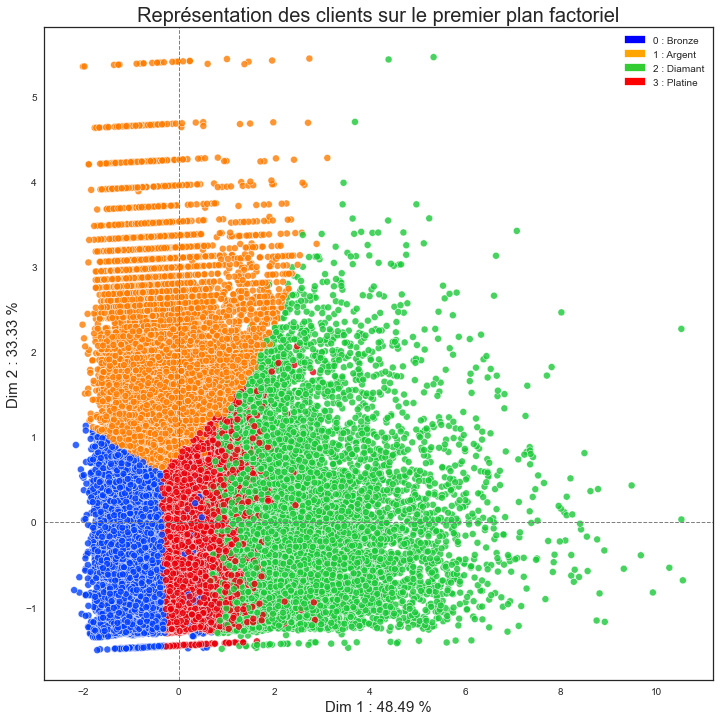

In [201]:
# Niveau des clients : Diamant, platine, argent ou bronze
# --------------------------------------------------------------------
# Transformation en DataFrame pandas
df_PCA = pd.DataFrame({
    'Dim1' : X_trans[:, 0], 
    'Dim2' : X_trans[:, 1],
    'Cluster' : clus.labels_
})

fig = plt.figure(figsize=(12, 12))

sns.set_style('white')

g_pca = sns.scatterplot(x='Dim1', y='Dim2', data = df_PCA,
                        hue = 'Cluster', palette='bright', alpha=0.8)
plt.title('Représentation des clients sur le premier plan factoriel', 
          size=20)
g_pca.set_xlabel('Dim 1 : ' + \
                 str(round(pca_rfm.explained_variance_ratio_[0]* 100,2)) \
                 + ' %', fontsize=15)
g_pca.set_ylabel('Dim 2 : ' + \
                 str(round(pca_rfm.explained_variance_ratio_[1]* 100,2)) \
                 + ' %', fontsize=15)

plt.axvline(color='gray', linestyle='--', linewidth=1)
plt.axhline(color='gray', linestyle='--', linewidth=1)

cluster_0 = mpatches.Patch(color='Blue', label='0 : Bronze')
cluster_1 = mpatches.Patch(color='Orange', label='1 : Argent')
cluster_2 = mpatches.Patch(color='LimeGreen', label='2 : Diamant')
cluster_3 = mpatches.Patch(color='Red', label='3 : Platine')
plt.legend(handles=[cluster_0, cluster_1, cluster_2, cluster_3])

plt.show()

***Légende*** :
***
Dimensions :
- **Dim 1** : montant/ fréquence
- **Dim 2** : récence.

Clusters :
- **0** : Bronze
- **1** : Argent
- **2** : Diamant
- **3** : Platine

- Les clusters 0 Bronze et 1 Argent sont bien séparés.
- Mais confirmation du mélange des clusters 3 Platine et 2 Diamant.

<span style='background:PaleTurquoise'>**Niveau des 12 segments des clients**</span>

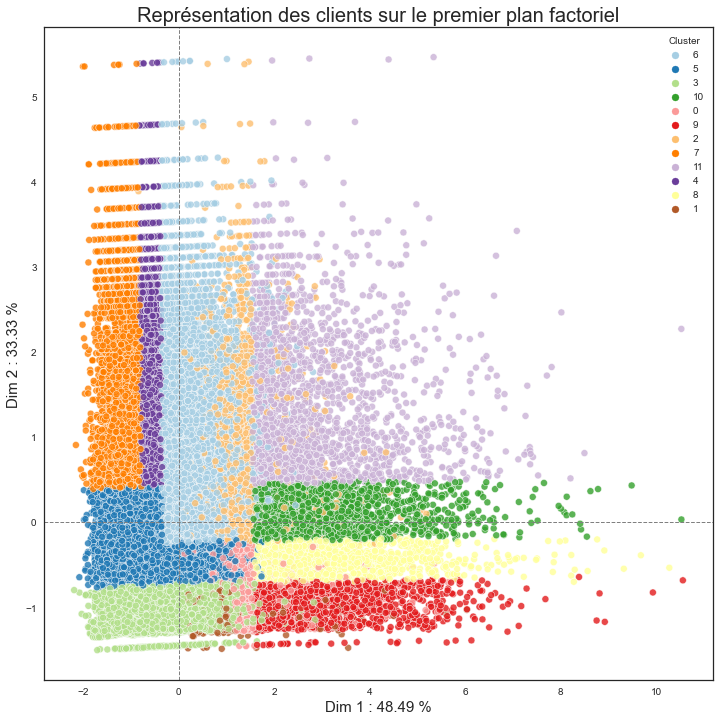

In [207]:
# Niveau des 12 segments clients : Client perdu, nouveau client, VIP...
# --------------------------------------------------------------------
# Transformation en DataFrame pandas
df_PCA = pd.DataFrame({
    'Dim1' : X_trans[:, 0], 
    'Dim2' : X_trans[:, 1],
    'Cluster' : liste_k_seg
})

palette = sns.color_palette('Paired', n_colors=12)

fig = plt.figure(figsize=(12, 12))
g_pca = sns.scatterplot(x='Dim1', y='Dim2', data = df_PCA,
                        hue = 'Cluster', palette=palette, alpha=0.8)
plt.title('Représentation des clients sur le premier plan factoriel', 
          size=20)
g_pca.set_xlabel('Dim 1 : ' + \
                 str(round(pca_rfm.explained_variance_ratio_[0]* 100,2)) \
                 + ' %', fontsize=15)
g_pca.set_ylabel('Dim 2 : ' + \
                 str(round(pca_rfm.explained_variance_ratio_[1]* 100,2)) \
                 + ' %', fontsize=15)
plt.axvline(color='gray', linestyle='--', linewidth=1)
plt.axhline(color='gray', linestyle='--', linewidth=1)
plt.show()

***Légende*** :
- **0** : Client en danger
- **1** : Client en hibernation
- **2** : Client fidèle
- **3** : Client perdu
- **4** : Client prometteur
- **5** : Client sur le point de dormir
- **6** : Fidélisation potentielle
- **7** : Nouveau client
- **8** : VIP en hibernation
- **9** : VIP perdu
- **10** : VIP à ne pas perdre
- **11** : Vips Champions

- Les différents groupes sont bien séparés malgré quelques mélanges :
    - des clients 0-Client en danger avec :
        - 3-Client perdu, 
        - 5-Client sur le point de dormir, 
        - 8-VIP en hibernation, 
        - et 9-VIP perdu. 
    - des clients 1-Client en hibernation avec :
        - 3-Client perdu,
        - et 9-VIP perdu.
    - et des clients 2-Client fidèle avec :
        - 6-Fidélisation potentielle, 
        - et 11-Vips Champions.

***Données transformées avec PowerTransformer***

In [208]:
%pycodestyle_on

In [209]:
# Analyse en composante principale
df_acp_pow = df_rfm_scaled_pow.copy()[['rfm_recence', 'rfm_frequence',
                                       'rfm_montant']]

In [210]:
# Décomposation ACP
pca_rfm_pow = decomposition.PCA()
pca_rfm_pow.fit(df_acp_pow)
expl_var_pow = pca_rfm_pow.explained_variance_ratio_.cumsum()*100
display(f'Explication de la variance : {expl_var_pow}')
X_trans_pow = pca_rfm_pow.transform(df_acp_pow)

'Explication de la variance : [ 46.45309684  79.79393687 100.        ]'

In [215]:
%pycodestyle_off

<span style='background:PaleTurquoise'>**Niveau des clients : Diamant, platine, argent ou bronze**</span>

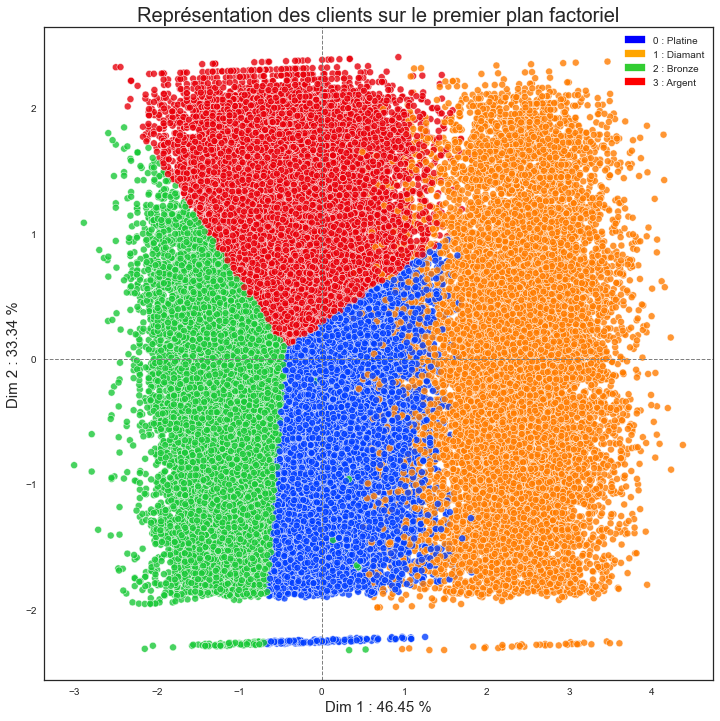

In [216]:
# Niveau des clients : Diamant, platine, argent ou bronze
# --------------------------------------------------------------------
# Transformation en DataFrame pandas
df_PCA_pow = pd.DataFrame({
    'Dim1' : X_trans_pow[:, 0], 
    'Dim2' : X_trans_pow[:, 1],
    'Cluster' : clus_pow.labels_
})

fig = plt.figure(figsize=(12, 12))
g_pca = sns.scatterplot(x='Dim1', y='Dim2', data = df_PCA_pow,
                        hue = 'Cluster', palette='bright', alpha=0.8)
plt.title('Représentation des clients sur le premier plan factoriel', 
          size=20)
g_pca.set_xlabel('Dim 1 : ' + \
                 str(round(pca_rfm_pow.explained_variance_ratio_[0]* 100,2)) \
                 + ' %', fontsize=15)
g_pca.set_ylabel('Dim 2 : ' + \
                 str(round(pca_rfm_pow.explained_variance_ratio_[1]* 100,2)) \
                 + ' %', fontsize=15)
plt.axvline(color='gray', linestyle='--', linewidth=1)
plt.axhline(color='gray', linestyle='--', linewidth=1)

cluster_0 = mpatches.Patch(color='Blue', label='0 : Platine')
cluster_1 = mpatches.Patch(color='Orange', label='1 : Diamant')
cluster_2 = mpatches.Patch(color='LimeGreen', label='2 : Bronze')
cluster_3 = mpatches.Patch(color='Red', label='3 : Argent')
plt.legend(handles=[cluster_0, cluster_1, cluster_2, cluster_3])

plt.show()

- Le cluster 2 Bronze est bien séparé.
- Mais les 3 autres clusters : 1 Diamant, 2 Platine et 3 Argent sont bien plus mélangés qu'avec K-Means avec les données standardisées avec StandardScaler.

In [67]:
%pycodestyle_on

<span style='background:PaleTurquoise'>**Niveau des 12 segments des clients**</span>

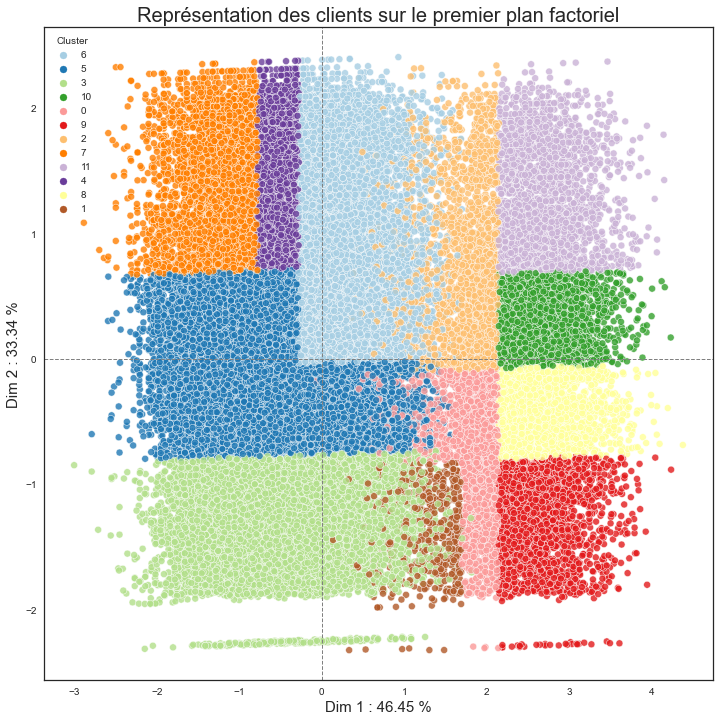

In [188]:
# Niveau des 12 segments clients : Client perdu, nouveau client, VIP...
# --------------------------------------------------------------------
df_PCA_pow = pd.DataFrame({
    'Dim1' : X_trans_pow[:, 0], 
    'Dim2' : X_trans_pow[:, 1],
    'Cluster' : liste_k_seg
})

palette = sns.color_palette('Paired', n_colors=12)

fig = plt.figure(figsize=(12, 12))
g_pca = sns.scatterplot(x='Dim1', y='Dim2', data = df_PCA_pow,
                        hue = 'Cluster', palette=palette, alpha=0.8)
plt.title('Représentation des clients sur le premier plan factoriel', 
          size=20)
g_pca.set_xlabel('Dim 1 : ' + \
                 str(round(pca_rfm_pow.explained_variance_ratio_[0]* 100,2)) \
                 + ' %', fontsize=15)
g_pca.set_ylabel('Dim 2 : ' + \
                 str(round(pca_rfm_pow.explained_variance_ratio_[1]* 100,2)) \
                 + ' %', fontsize=15)
plt.axvline(color='gray', linestyle='--', linewidth=1)
plt.axhline(color='gray', linestyle='--', linewidth=1)
plt.show()

- Les groupes sont bien mieux séparés qu'avec les données standardisées avec StandardScaler.
- On observe les mêmes mélanges : 
    - des clients 0-Client en danger avec :
        - 3-Client perdu, 
        - 5-Client sur le point de dormir, 
        - 8-VIP en hibernation, 
        - et 9-VIP perdu. 
    - des clients 1-Client en hibernation avec :
        - 3-Client perdu,
        - et 9-VIP perdu.
    - et des clients 2-Client fidèle avec :
        - 6-Fidélisation potentielle, 
        - et 11-Vips Champions.

In [217]:
%pycodestyle_on

**TRACÉ RADAR**

<span style='background:PaleTurquoise'>**Niveau des clients : Diamant, platine, argent ou bronze**</span>

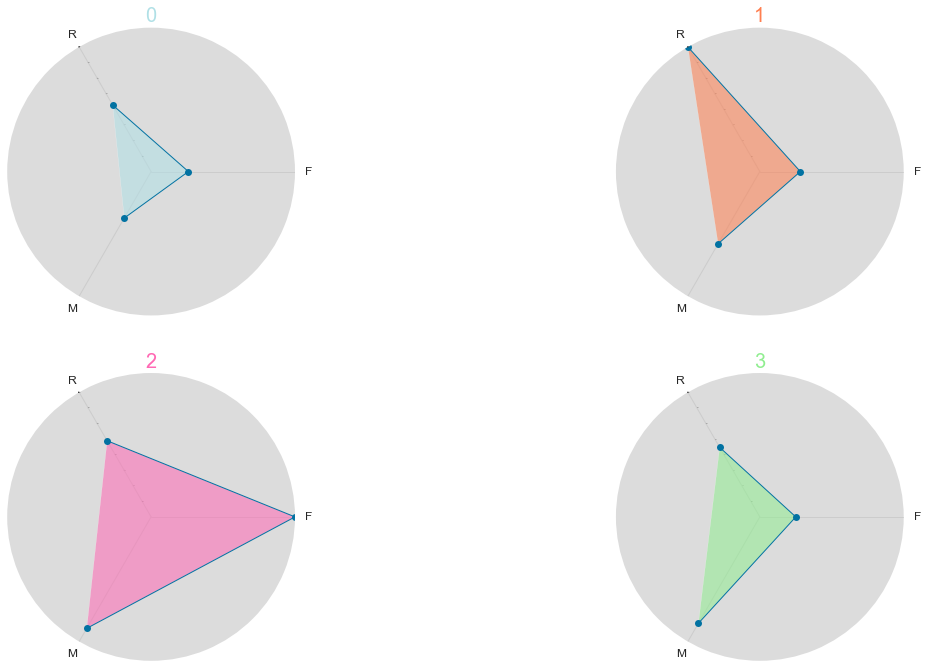

In [218]:
# Niveau des clients : Diamant, platine, argent ou bronze
# --------------------------------------------------------------------
# Radarplot des différents clusters

df_plot = df_segm_rfm.groupby('K_Cluster')[['R', 'F', 'M']].mean()
plt.rc('axes', facecolor='Gainsboro')

# number of variable
categories = list(df_plot.columns)

N = len(categories)

# What will be the angle of each axis in the plot? (we divide the plot /
# number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]


fig = plt.figure(1, figsize=(20, 18))

colors = ['PowderBlue', 'Coral', 'HotPink', 'LightGreen']


for i, region in enumerate(df_plot.index):

    ax = fig.add_subplot(3, 2, i+1, polar=True)

    ax.set_theta_offset(2*pi/3)
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(0)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles, categories, size=10)
    plt.yticks(color="grey", size=2)
    values = df_plot.iloc[i].values
    ax.plot(angles, values, 'o-', linewidth=1, linestyle='solid')
    ax.fill(angles, values, colors[i], alpha=0.55)
    ax.set_xticks(angles)
    ax.set_xticklabels(categories, fontsize=12)
    ax.set_title(region, size=20, color=colors[i])
    ax.grid(True)
    plt.grid(True)
    plt.ylim(0, 4)

plt.show()

<span style='background:PaleTurquoise'>**Niveau des 12 segments des clients**</span>

In [220]:
# Encodage manuelle RFM_Segm_Client dans K_segm_client
df_segm_rfm['K_segm_client'] = ['0' if row == 'Client en danger'
                                else '1' if row == 'Client en hibernation'
                                else '2' if row == 'Client fidèle'
                                else '3' if row == 'Client perdu'
                                else '4' if row == 'Client prometteur'
                                else '5'
                                if row == 'Client sur le point de dormir'
                                else '6' if row == 'Fidélisation potentielle'
                                else '7' if row == 'Nouveau client'
                                else '8' if row == 'VIP en hibernation'
                                else '9' if row == 'VIP perdu'
                                else '10' if row == 'VIP à ne pas perdre'
                                else '11' if row == 'Vips Champions'
                                else '12'
                                for row in df_segm_rfm['RFM_Segm_Client']]

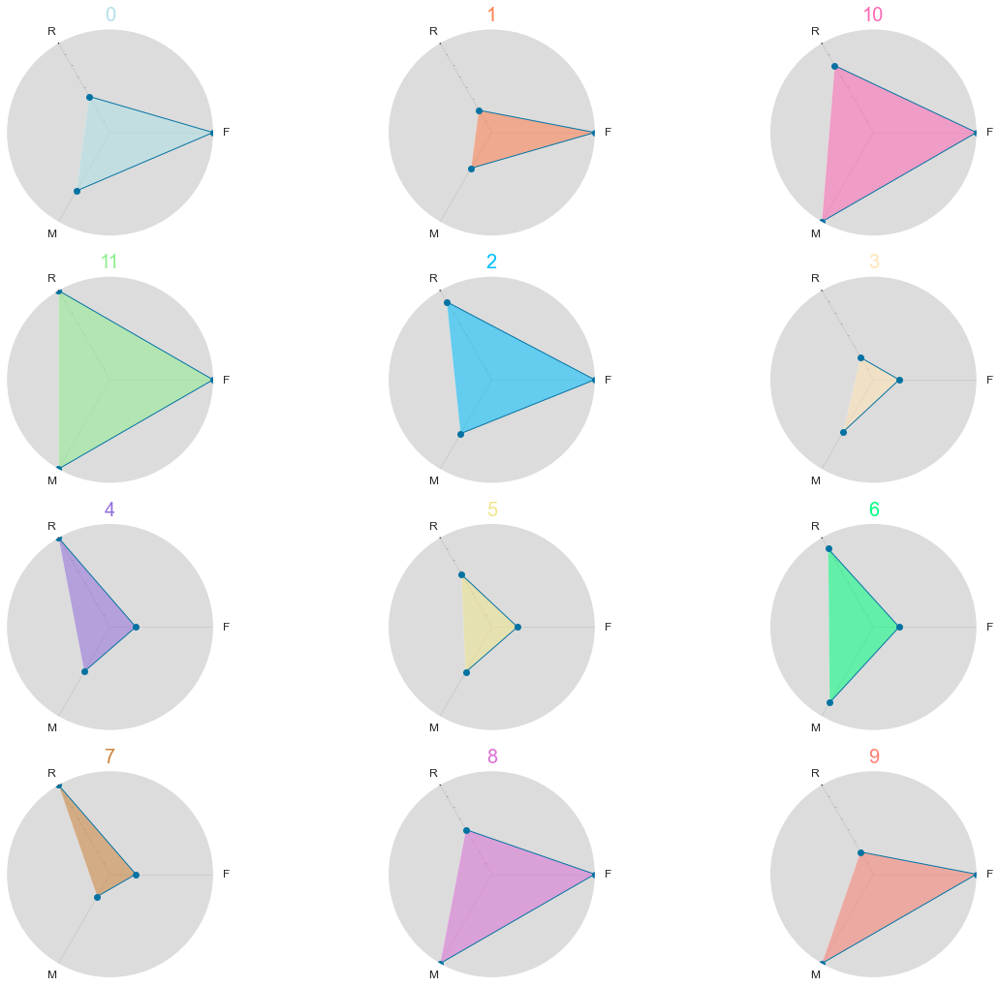

In [224]:
# Niveau des 12 segments clients : Client perdu, nouveau client, VIP...
# --------------------------------------------------------------------
# Radarplot des différents clusters

df_plot_seg = df_segm_rfm.groupby('K_segm_client')[['R', 'F', 'M']].mean()
plt.rc('axes', facecolor='Gainsboro')

# number of variable
categories = list(df_plot_seg.columns)

N = len(categories)

# What will be the angle of each axis in the plot? (we divide the plot /
# number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]


fig = plt.figure(1, figsize=(20, 18))

colors = ['PowderBlue', 'Coral', 'HotPink', 'LightGreen', 'DeepSkyBlue',
          'Moccasin', 'MediumPurple', 'Khaki', 'SpringGreen', 'Peru',
          'Orchid', 'Salmon']


for i, region in enumerate(df_plot_seg.index):

    ax = fig.add_subplot(4, 3, i+1, polar=True)

    ax.set_theta_offset(2*pi/3)
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(0)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles, categories, size=10)
    plt.yticks(color="grey", size=2)
    values = df_plot_seg.iloc[i].values
    ax.plot(angles, values, 'o-', linewidth=1, linestyle='solid')
    ax.fill(angles, values, colors[i], alpha=0.55)
    ax.set_xticks(angles)
    ax.set_xticklabels(categories, fontsize=12)
    ax.set_title(region, size=20, color=colors[i])
    ax.grid(True)
    plt.grid(True)
    plt.ylim(0, 4)

plt.show()

**3D Plot**

In [69]:
# 3D plot
px.scatter_3d(df_segm_rfm, x='rfm_recence', y='rfm_frequence',
              z='rfm_montant', color='K_Cluster')

## <span style='background:Thistle'>4. Stabilité de la clientèle sur 6 mois</span>

In [70]:
# Chargement du jeu de données
df_stab = pd.read_csv('OLIST_data_analyse_stabilite.csv')

In [71]:
df_stab.drop(columns=['Unnamed: 0'], inplace=True)

In [72]:
# Taille : nombre de lignes/colonnes
nRow, nCol = df_stab.shape
print(f'Le jeu de données contient {nRow} lignes et {nCol} colonnes.')

Le jeu de données contient 121757 lignes et 47 colonnes.


In [73]:
df_stab.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,geolocation_lat,geolocation_lng,review_score,order_item_id,product_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,product_category_name_english,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,nb_avis,date_premier_achat,premier_achat_jour,date_dernier_achat,dernier_achat_annee,dernier_achat_mois,dernier_achat_jour,dernier_achat_heure,dernier_achat_jour_prefere,nbr_commandes,nbr_articles,nbr_articles_mean,panier_moyen,montant_bas,montant_haut,moyen_paiement_prefere,echeance_paiement_mean,frais_port_mean,cat_produit_prefere
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00,-20.49849,-47.39693,4,1.0,a9516a079e37a9c9c36b9b78b10169e8,2017-05-22 15:22:12,124.99,21.88,1.0,credit_card,2.0,146.87,home,470,1,146.87,4.0,1,2017-05-16 15:05:35,470,2017-05-16 15:05:35,2017,5,16,15,1,1,1,1.0,124.99,146.87,146.87,credit_card,2.0,21.88,home
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,2018-01-29 12:41:19,2018-02-06 00:00:00,-23.72799,-46.54285,5,1.0,4aa6014eceb682077f9dc4bffebc05b0,2018-01-18 20:58:32,289.00,46.48,1.0,credit_card,8.0,335.48,home,229,1,335.48,5.0,1,2018-01-12 20:48:24,229,2018-01-12 20:48:24,2018,1,12,20,4,1,1,1.0,289.00,335.48,335.48,credit_card,8.0,46.48,home
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,2018-06-14 17:58:51,2018-06-13 00:00:00,-23.53164,-46.65629,5,1.0,bd07b66896d6f1494f5b86251848ced7,2018-06-05 16:19:10,139.94,17.79,1.0,credit_card,7.0,157.73,home,102,1,157.73,5.0,1,2018-05-19 16:07:45,102,2018-05-19 16:07:45,2018,5,19,16,5,1,1,1.0,139.94,157.73,157.73,credit_card,7.0,17.79,home
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,2018-03-28 16:04:25,2018-04-10 00:00:00,-23.49970,-46.18523,5,1.0,a5647c44af977b148e0a3a4751a09e2e,2018-03-27 16:31:16,149.94,23.36,1.0,credit_card,1.0,173.30,home,169,1,173.30,5.0,1,2018-03-13 16:06:38,169,2018-03-13 16:06:38,2018,3,13,16,1,1,1,1.0,149.94,173.30,173.30,credit_card,1.0,23.36,home
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-07-30 15:16:00,2018-08-09 20:55:48,2018-08-15 00:00:00,-22.97510,-47.14293,5,1.0,9391a573abe00141c56e38d84d7d5b3b,2018-07-31 10:10:09,230.00,22.25,1.0,credit_card,8.0,252.25,home,32,1,252.25,5.0,1,2018-07-29 09:51:30,32,2018-07-29 09:51:30,2018,7,29,9,6,1,1,1.0,230.00,252.25,252.25,credit_card,8.0,22.25,home


### <span style='background:PowderBlue'>4.1. Segmentation RFM de la clientèle sur 6 mois</span>

In [74]:
# Dataframe de sauvegarde des métriques de stabilité du dataframe
df_resultats_rfm = pd.DataFrame({})

In [75]:
# Détermination des dates de référence
# ---------------------------------------------------------------------
# Date de référence de la période complète ?
date_reference = df_stab['order_purchase_timestamp'].max()
print(f'Data de référence période complète : {date_reference}')
# Data de référence transformée
date_reference = pd.to_datetime(date_reference,
                                format='%Y-%m-%d %H:%M:%S')
# Data de référence de la première période historique - 1 mois
data_ref_1mois = date_reference - pd.DateOffset(months=1)
print(f'Data de référence histo - 1 mois : {data_ref_1mois}')
# Data de référence de la première période historique - 3 mois
data_ref_3mois = date_reference - pd.DateOffset(months=3)
print(f'Data de référence histo - 3 mois : {data_ref_3mois}')
# Data de référence de la première période historique - 6 mois
data_ref_6mois = date_reference - pd.DateOffset(months=6)
print(f'Data de référence histo - 6 mois : {data_ref_6mois}')

Data de référence période complète : 2018-08-29 15:00:37
Data de référence histo - 1 mois : 2018-07-29 15:00:37
Data de référence histo - 3 mois : 2018-05-29 15:00:37
Data de référence histo - 6 mois : 2018-02-28 15:00:37


#### <span style='background:PaleGreen'>**4.1.1. Segmentation RFM - 1 mois avant le fin de l'historique 29/07/2018**</span>

In [76]:
df_resultats_rfm, df_rfm_1mois = \
    outils_segmentation.segmentation_rfm_periode(df_stab, df_segm_rfm,
                                                 df_resultats_rfm,
                                                 'customer_unique_id',
                                                 'order_purchase_timestamp',
                                                 'order_id',
                                                 'payment_value',
                                                 data_ref_1mois,
                                                 '1_mois_Juillet_Août')

Période : Min : 2016-10-03 09:44:50, Max : 2018-07-29 14:54:53
Date de référence : 2018-07-30 14:54:53
(85040, 13)
(85040, 10)
Métrique ARI : 0.736882353807713


#### <span style='background:PaleGreen'>**4.1.2. Segmentation RFM - 3 mois avant le fin de l'historique 30/05/2018**</span>

In [77]:
df_resultats_rfm, df_rfm_3mois = \
    outils_segmentation.segmentation_rfm_periode(df_stab, df_segm_rfm,
                                                 df_resultats_rfm,
                                                 'customer_unique_id',
                                                 'order_purchase_timestamp',
                                                 'order_id',
                                                 'payment_value',
                                                 data_ref_3mois,
                                                 '3_mois_Mai_Août')

Période : Min : 2016-10-03 09:44:50, Max : 2018-05-29 14:54:54
Date de référence : 2018-05-30 14:54:54
(73650, 13)
(73650, 10)
Métrique ARI : 0.577091924596571


#### <span style='background:PaleGreen'>**4.1.3. Segmentation RFM - 6 mois avant le fin de l'historique 28/02/2018**</span>

In [78]:
df_resultats_rfm, df_rfm_6mois = \
    outils_segmentation.segmentation_rfm_periode(df_stab, df_segm_rfm,
                                                 df_resultats_rfm,
                                                 'customer_unique_id',
                                                 'order_purchase_timestamp',
                                                 'order_id',
                                                 'payment_value',
                                                 data_ref_6mois,
                                                 '6_mois_Mai_Août')

Période : Min : 2016-10-03 09:44:50, Max : 2018-02-28 14:57:20
Date de référence : 2018-03-01 14:57:20
(54224, 13)
(54224, 10)
Métrique ARI : 0.5558974309152308


In [79]:
# Les scores ARI des différentes périodes d'historique
df_resultats_rfm.style.hide_index()

Periode,ARI
1_mois_Juillet_Août,0.73688
3_mois_Mai_Août,0.57709
6_mois_Mai_Août,0.55590


### <span style='background:PowderBlue'>4.2. Visualisation de l'évolution des segments de clientèle</span>

- Les **diagrammes Sankey** sont très utiles pour observer visuellement l'évolution des segments de clientèle.
- Les diagrammes de Sankey sont un type de diagramme de flux dans lequel la largeur des flèches est proportionnelle au débit. Il permet la visualisation de la répartition entre un plot initial et plusieurs plots plus petits suivants.

#### <span style='background:PaleGreen'>**4.2.1. Constitution des dataframes de travail pour diagrammes Snakey**</span>

In [80]:
# Constitution du dataframe de travail pour diagramme sankey
# ------------------------------------------------------------------
# Fusion jeu de données période complète et historique sur 1 mois
df_rfm_1mois.rename(columns={'RFM_Segm_Client': 'RFM_Segm_1mois'},
                    inplace=True)
df_sankey = pd.merge(df_segm_rfm[['customer_unique_id', 'RFM_Segm_Client']],
                     df_rfm_1mois[['customer_unique_id',
                                   'RFM_Segm_1mois']],
                     on='customer_unique_id', how='left')
# Fusion jeu de données période complète/ historique sur 1 mois
# et historique sur 3 mois
df_rfm_3mois.rename(columns={'RFM_Segm_Client': 'RFM_Segm_3mois'},
                    inplace=True)
df_sankey = pd.merge(df_sankey, df_rfm_3mois[['customer_unique_id',
                                              'RFM_Segm_3mois']],
                     on='customer_unique_id', how='left')
# Fusion jeu de données période complète/ historique sur 1 mois/
# historique sur 3 mois et historique sur 6 mois
df_rfm_6mois.rename(columns={'RFM_Segm_Client': 'RFM_Segm_6mois'},
                    inplace=True)
df_sankey = pd.merge(df_sankey, df_rfm_6mois[['customer_unique_id',
                                              'RFM_Segm_6mois']],
                     on='customer_unique_id', how='left')
df_sankey.head()

,customer_unique_id,RFM_Segm_Client,RFM_Segm_1mois,RFM_Segm_3mois,RFM_Segm_6mois
0,0000366f3b9a7992bf8c76cfdf3221e2,Fidélisation potentielle,Fidélisation potentielle,Fidélisation potentielle,NaN
1,0000b849f77a49e4a4ce2b2a4ca5be3f,Client sur le point de dormir,Nouveau client,Nouveau client,NaN
2,0000f46a3911fa3c0805444483337064,Client perdu,Client perdu,Client perdu,Client perdu
3,0000f6ccb0745a6a4b88665a16c9f078,Client sur le point de dormir,Client sur le point de dormir,Client sur le point de dormir,Client sur le point de dormir
4,0004aac84e0df4da2b147fca70cf8255,Client sur le point de dormir,Client sur le point de dormir,Client sur le point de dormir,Fidélisation potentielle


In [81]:
%pycodestyle_off

In [82]:
# Dataframe de comparaison période complète / historique après 1 mois
# --------------------------------------------------------------------
df_sankey_1mois = \
    df_sankey.groupby(by=['RFM_Segm_1mois', 'RFM_Segm_Client']) \
    .agg({'RFM_Segm_Client' : 'count'})
df_sankey_1mois.rename(columns={'RFM_Segm_Client' : 'value_1mois'}, 
                       inplace=True)
df_sankey_1mois = df_sankey_1mois.reset_index()

In [83]:
# Dataframe de comparaison période complète / historique après 3 mois
# --------------------------------------------------------------------
df_sankey_3mois = \
    df_sankey.groupby(by=['RFM_Segm_3mois', 'RFM_Segm_Client']) \
    .agg({'RFM_Segm_Client' : 'count'})
df_sankey_3mois.rename(columns={'RFM_Segm_Client' : 'value_3mois'}, 
                       inplace=True)
df_sankey_3mois = df_sankey_3mois.reset_index()

In [84]:
# Dataframe de comparaison période complète / historique après 6 mois
# --------------------------------------------------------------------
df_sankey_6mois = \
    df_sankey.groupby(by=['RFM_Segm_6mois', 'RFM_Segm_Client']) \
    .agg({'RFM_Segm_Client' : 'count'})
df_sankey_6mois.rename(columns={'RFM_Segm_Client' : 'value_6mois'}, 
                       inplace=True)
df_sankey_6mois = df_sankey_6mois.reset_index()

In [85]:
%pycodestyle_on

In [86]:
# Préparation de la source du diagramme Sankey
# --------------------------------------------------------------------
# Ajout de la variable source : transformation string en int
# Comparaison stabilité sur 1 mois
df_sankey_1mois['Source'] = ['0' if row == 'Client en danger'
                             else '1' if row == 'Client en hibernation'
                             else '2' if row == 'Client fidèle'
                             else '3' if row == 'Client perdu'
                             else '4' if row == 'Client prometteur'
                             else '5' if row == 'Client sur le point de dormir'
                             else '6' if row == 'Fidélisation potentielle'
                             else '7' if row == 'Nouveau client'
                             else '8' if row == 'VIP en hibernation'
                             else '9' if row == 'VIP perdu'
                             else '10' if row == 'VIP à ne pas perdre'
                             else '11' if row == 'Vips Champions'
                             else '12'
                             for row in df_sankey_1mois['RFM_Segm_1mois']]
# Comparaison stabilité sur 3 mois
df_sankey_3mois['Source'] = ['0' if row == 'Client en danger'
                             else '1' if row == 'Client en hibernation'
                             else '2' if row == 'Client fidèle'
                             else '3' if row == 'Client perdu'
                             else '4' if row == 'Client prometteur'
                             else '5' if row == 'Client sur le point de dormir'
                             else '6' if row == 'Fidélisation potentielle'
                             else '7' if row == 'Nouveau client'
                             else '8' if row == 'VIP en hibernation'
                             else '9' if row == 'VIP perdu'
                             else '10' if row == 'VIP à ne pas perdre'
                             else '11' if row == 'Vips Champions'
                             else '12'
                             for row in df_sankey_3mois['RFM_Segm_3mois']]
# Comparaison stabilité sur 6 mois
df_sankey_6mois['Source'] = ['0' if row == 'Client en danger'
                             else '1' if row == 'Client en hibernation'
                             else '2' if row == 'Client fidèle'
                             else '3' if row == 'Client perdu'
                             else '4' if row == 'Client prometteur'
                             else '5' if row == 'Client sur le point de dormir'
                             else '6' if row == 'Fidélisation potentielle'
                             else '7' if row == 'Nouveau client'
                             else '8' if row == 'VIP en hibernation'
                             else '9' if row == 'VIP perdu'
                             else '10' if row == 'VIP à ne pas perdre'
                             else '11' if row == 'Vips Champions'
                             else '12'
                             for row in df_sankey_6mois['RFM_Segm_6mois']]

In [87]:
# Préparation de la target du diagramme Sankey
# --------------------------------------------------------------------
# Ajout de la variable target : transformation string en int
# Comparaison stabilité sur 1 mois
df_sankey_1mois['Target'] = ['12' if row == 'Client en danger'
                             else '13' if row == 'Client en hibernation'
                             else '14' if row == 'Client fidèle'
                             else '15' if row == 'Client perdu'
                             else '16' if row == 'Client prometteur'
                             else '17'
                             if row == 'Client sur le point de dormir'
                             else '18' if row == 'Fidélisation potentielle'
                             else '19' if row == 'Nouveau client'
                             else '20' if row == 'VIP en hibernation'
                             else '21' if row == 'VIP perdu'
                             else '22' if row == 'VIP à ne pas perdre'
                             else '23' if row == 'Vips Champions'
                             else '24'
                             for row in df_sankey_1mois['RFM_Segm_Client']]
# Comparaison stabilité sur 3 mois
df_sankey_3mois['Target'] = ['12' if row == 'Client en danger'
                             else '13' if row == 'Client en hibernation'
                             else '14' if row == 'Client fidèle'
                             else '15' if row == 'Client perdu'
                             else '16' if row == 'Client prometteur'
                             else '17'
                             if row == 'Client sur le point de dormir'
                             else '18' if row == 'Fidélisation potentielle'
                             else '19' if row == 'Nouveau client'
                             else '20' if row == 'VIP en hibernation'
                             else '21' if row == 'VIP perdu'
                             else '22' if row == 'VIP à ne pas perdre'
                             else '23' if row == 'Vips Champions'
                             else '24'
                             for row in df_sankey_3mois['RFM_Segm_Client']]
# Comparaison stabilité sur 6 mois
df_sankey_6mois['Target'] = ['12' if row == 'Client en danger'
                             else '13' if row == 'Client en hibernation'
                             else '14' if row == 'Client fidèle'
                             else '15' if row == 'Client perdu'
                             else '16' if row == 'Client prometteur'
                             else '17'
                             if row == 'Client sur le point de dormir'
                             else '18' if row == 'Fidélisation potentielle'
                             else '19' if row == 'Nouveau client'
                             else '20' if row == 'VIP en hibernation'
                             else '21' if row == 'VIP perdu'
                             else '22' if row == 'VIP à ne pas perdre'
                             else '23' if row == 'Vips Champions'
                             else '24'
                             for row in df_sankey_6mois['RFM_Segm_Client']]

In [88]:
label = ['Client en danger', 'Client en hibernation', 'Client fidèle',
         'Client perdu', 'Client prometteur',
         'Client sur le point de dormir', 'Fidélisation potentielle',
         'Nouveau client', 'VIP en hibernation', 'VIP perdu',
         'VIP à ne pas perdre', 'Vips Champions', 'Client en danger',
         'Client en hibernation', 'Client fidèle', 'Client perdu',
         'Client prometteur', 'Client sur le point de dormir',
         'Fidélisation potentielle', 'Nouveau client',
         'VIP en hibernation', 'VIP perdu', 'VIP à ne pas perdre',
         'Vips Champions']

#### <span style='background:PaleGreen'>**4.2.2. Visualisation stabilité - 1 mois avant le fin de l'historique 29/07/2018**</span>

In [89]:
source_1mois = df_sankey_1mois['Source'].to_list()
target_1mois = df_sankey_1mois['Target'].to_list()
value_1mois = df_sankey_1mois['value_1mois'].to_list()

In [90]:
color_link_1 = ['#EBBAB5', '#EBBAB5', '#EBBAB5',
                '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5',
                '#8FF9FF', '#8FF9FF', '#8FF9FF', '#8FF9FF', '#8FF9FF',
                '#FF90A1', '#FF90A1', '#FF90A1', '#FF90A1',
                '#FFE18F', '#FFE18F', '#FFE18F', '#FFE18F', '#FFE18F',
                '#D98880', '#D98880', '#D98880',
                '#A6E3D7', '#A6E3D7', '#A6E3D7', '#A6E3D7', '#A6E3D7',
                '#A6E3D7',
                '#71E8F8', '#71E8F8', '#71E8F8', '#71E8F8', '#71E8F8',
                '#B6BAF5', '#B6BAF5', '#B6BAF5', '#B6BAF5', '#B6BAF5',
                '#D2B4DE', '#D2B4DE', '#D2B4DE', '#D2B4DE',
                '#FEF3C7', '#FEF3C7', '#FEF3C7', '#FEF3C7', '#FEF3C7',
                '#F4682F', '#F4682F', '#F4682F']

In [91]:
# Node data
color_node_1 = ['#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                '#808B96', '#808B96',
                '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                '#808B96', '#808B96']

In [226]:
# data to dict, dict to sankey
link = dict(source=source_1mois, target=target_1mois,
            value=value_1mois, color=color_link_1)
node = dict(label=label, pad=25, thickness=5, color=color_node_1)
data_1 = go.Sankey(link=link, node=node, arrangement='freeform')

In [242]:
# plot comparaison historique sur 1 mois
fig_1 = go.Figure(data_1)
fig_1.update_layout(
    hovermode='x',
    title="Segmentation RFM clientèle OLIST - JUILLET à AOUT 2018 - 1 mois",
    font=dict(size=14, color='white'),
    paper_bgcolor='#5B5958',
    width=1000,
    height=1000,
)

# Sauvegarde du diagramme Sankey en fichier html
fig_1.write_html('images/sankey/RFM_OLIST_juillet_aout_2018.html')

fig_1.show()

**Zoom sur les meilleurs clients**

In [94]:
df_sankey_1mois_best = df_sankey_1mois[df_sankey_1mois['RFM_Segm_1mois']
                                       .isin(['Client fidèle',
                                              'Vips Champions',
                                              'VIP à ne pas perdre'])]

In [95]:
source_1mois_best = df_sankey_1mois_best['Source'].to_list()
target_1mois_best = df_sankey_1mois_best['Target'].to_list()
value_1mois_best = df_sankey_1mois_best['value_1mois'].to_list()

In [96]:
color_link_1_b = ['#EBBAB5', '#EBBAB5', '#EBBAB5', '#EBBAB5', '#EBBAB5',
                  '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5',
                  '#8FF9FF', '#8FF9FF', '#8FF9FF']

In [97]:
# Node data
color_node_1_b = ['#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96']

In [243]:
# data to dict, dict to sankey
link = dict(source=source_1mois_best, target=target_1mois_best,
            value=value_1mois_best, color=color_link_1_b)
node = dict(label=label, pad=25, thickness=5,
            color=color_node_1_b)
data_2 = go.Sankey(link=link, node=node, arrangement='freeform')

In [260]:
# plot comparaison historique sur 1 mois - les meilleurs clients
titre = 'RFM OLIST MEILLEURS CLIENTS - JUILLET à AOUT 2018 - 1 mois'
fig_2 = go.Figure(data_2)
fig_2.update_layout(
    hovermode='x',
    title=titre,
    font=dict(size=14, color='white'),
    paper_bgcolor='#5B5958',
)

# Sauvegarde du diagramme Sankey en fichier html
titre_2 = 'images/sankey/RFM_OLIST_juillet_aout_2018_best_clients.html'
fig_2.write_html(titre_2)

fig_2.show()

**Zoom sur les clients en danger ou à surveiller**

In [100]:
df_sankey_1mois_flop = df_sankey_1mois[df_sankey_1mois['RFM_Segm_1mois']
                                       .isin(['Client en danger',
                                              'Client sur le point de dormir',
                                              'VIP à ne pas perdre'])]

In [101]:
source_1mois_flop = df_sankey_1mois_flop['Source'].to_list()
target_1mois_flop = df_sankey_1mois_flop['Target'].to_list()
value_1mois_flop = df_sankey_1mois_flop['value_1mois'].to_list()

In [102]:
color_link_1_f = ['#EBBAB5', '#EBBAB5', '#EBBAB5', '#EBBAB5', '#EBBAB5',
                  '#EBBAB5',
                  '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5',
                  '#8FF9FF', '#8FF9FF', '#8FF9FF', '#8FF9FF', '#8FF9FF']

In [103]:
# Node data
color_node_1_f = ['#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96']

In [262]:
# data to dict, dict to sankey
link = dict(source=source_1mois_flop, target=target_1mois_flop,
            value=value_1mois_flop, color=color_link_1_f)
node = dict(label=label, pad=25, thickness=5,
            color=color_node_1_f)
data_3 = go.Sankey(link=link, node=node, arrangement='freeform')

In [263]:
# plot comparaison historique sur 1 mois - les clients presque perdus
fig_3 = go.Figure(data_3)
fig_3.update_layout(
    hovermode='x',
    title='RFM OLIST - FLOP CLIENTS - JUILLET à AOUT 2018 - 1 mois',
    font=dict(size=14, color='white'),
    paper_bgcolor='#5B5958',
)

# Sauvegarde du diagramme Sankey en fichier html
titre_3 = 'images/sankey/RFM_OLIST_juillet_aout_2018_flop_clients.html'
fig_3.write_html(titre_3)

fig_3.show()

#### <span style='background:PaleGreen'>**4.2.3. Visualisation stabilité - 3 mois avant le fin de l'historique 30/05/2018**</span>

In [106]:
source_3mois = df_sankey_3mois['Source'].to_list()
target_3mois = df_sankey_3mois['Target'].to_list()
value_3mois = df_sankey_3mois['value_3mois'].to_list()

In [107]:
color_link_3 = ['#EBBAB5', '#EBBAB5', '#EBBAB5',
                '#CBB4D5', '#CBB4D5', '#CBB4D5',
                '#8FF9FF', '#8FF9FF', '#8FF9FF', '#8FF9FF', '#8FF9FF',
                '#8FF9FF',
                '#FF90A1', '#FF90A1', '#FF90A1', '#FF90A1', '#FF90A1',
                '#FFE18F', '#FFE18F', '#FFE18F', '#FFE18F', '#FFE18F',
                '#D98880', '#D98880', '#D98880', '#D98880', '#D98880',
                '#A6E3D7', '#A6E3D7', '#A6E3D7', '#A6E3D7', '#A6E3D7',
                '#71E8F8', '#71E8F8', '#71E8F8', '#71E8F8',
                '#B6BAF5', '#B6BAF5', '#B6BAF5', '#B6BAF5', '#B6BAF5',
                '#B6BAF5',
                '#D2B4DE', '#D2B4DE', '#D2B4DE', '#D2B4DE', '#D2B4DE',
                '#FEF3C7', '#FEF3C7', '#FEF3C7', '#FEF3C7', '#FEF3C7',
                '#F4682F', '#F4682F', '#F4682F']

In [108]:
# Node data
color_node_3 = ['#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                '#808B96', '#808B96',
                '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                '#808B96', '#808B96']

In [264]:
# data to dict, dict to sankey
link = dict(source=source_3mois, target=target_3mois,
            value=value_3mois, color=color_link_3)
node = dict(label=label, pad=25, thickness=5, color=color_node_3)
data_4 = go.Sankey(link=link, node=node, arrangement='freeform')

In [269]:
# plot comparaison historique sur 3 mois
fig_4 = go.Figure(data_4)
fig_4.update_layout(
    hovermode='x',
    title='RFM OLIST - MAI à AOUT 2018 - 3 mois',
    font=dict(size=14, color='white'),
    paper_bgcolor='#5B5958',
    width=1000,
    height=1000
)

# Sauvegarde du diagramme Sankey en fichier html
titre_4 = 'images/sankey/RFM_OLIST_mai_aout_2018.html'
fig_4.write_html(titre_4)

fig_4.show()

**Zoom sur les meilleurs clients**

In [111]:
df_sankey_3mois_best = df_sankey_3mois[df_sankey_3mois['RFM_Segm_3mois']
                                       .isin(['Client fidèle',
                                              'Vips Champions',
                                              'VIP à ne pas perdre'])]

In [112]:
source_3mois_best = df_sankey_3mois_best['Source'].to_list()
target_3mois_best = df_sankey_3mois_best['Target'].to_list()
value_3mois_best = df_sankey_3mois_best['value_3mois'].to_list()

In [113]:
color_link_3_b = ['#EBBAB5', '#EBBAB5', '#EBBAB5', '#EBBAB5', '#EBBAB5',
                  '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5',
                  '#8FF9FF', '#8FF9FF', '#8FF9FF']

In [114]:
# Node data
color_node_3_b = ['#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96']

In [271]:
# data to dict, dict to sankey
link = dict(source=source_3mois_best, target=target_3mois_best,
            value=value_3mois_best, color=color_link_3_b)
node = dict(label=label, pad=25, thickness=5,
            color=color_node_3_b)
data_5 = go.Sankey(link=link, node=node, arrangement='freeform')

In [273]:
# plot comparaison historique sur 3 mois - meilleurs clients
fig_5 = go.Figure(data_5)
fig_5.update_layout(
    hovermode='x',
    title='RFM OLIST MEILLEURS CLIENTS - MAI à AOUT 2018 - 3 mois',
    font=dict(size=14, color='white'),
    paper_bgcolor='#5B5958',
)

# Sauvegarde du diagramme Sankey en fichier html
titre_5 = 'images/sankey/RFM_OLIST_mai_aout_2018_best_clients.html'
fig_5.write_html(titre_5)

fig_5.show()

**Zoom sur les clients en danger ou à surveiller**

In [117]:
df_sankey_3mois_flop = df_sankey_3mois[df_sankey_3mois['RFM_Segm_3mois']
                                       .isin(['Client en danger',
                                              'Client sur le point de dormir',
                                              'VIP à ne pas perdre'])]

In [118]:
source_3mois_flop = df_sankey_3mois_flop['Source'].to_list()
target_3mois_flop = df_sankey_3mois_flop['Target'].to_list()
value_3mois_flop = df_sankey_3mois_flop['value_3mois'].to_list()

In [119]:
color_link_3_f = ['#EBBAB5', '#EBBAB5', '#EBBAB5', '#EBBAB5', '#EBBAB5',
                  '#EBBAB5',
                  '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5',
                  '#8FF9FF', '#8FF9FF', '#8FF9FF', '#8FF9FF', '#8FF9FF']

In [120]:
# Node data
color_node_3_f = ['#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96']

In [278]:
# data to dict, dict to sankey
link = dict(source=source_3mois_flop, target=target_3mois_flop,
            value=value_3mois_flop, color=color_link_3_f)
node = dict(label=label, pad=25, thickness=5,
            color=color_node_3_f)
data_6 = go.Sankey(link=link, node=node, arrangement='freeform')

In [280]:
# plot comparaison historique sur 3 mois - clients presques perdus
fig_6 = go.Figure(data_6)
fig_6.update_layout(
    hovermode='x',
    title='RFM OLIST FLOP CLIENTS - MAI à AOUT 2018 - 3 mois',
    font=dict(size=14, color='white'),
    paper_bgcolor='#5B5958'
)

# Sauvegarde du diagramme Sankey en fichier html
titre_6 = 'images/sankey/RFM_OLIST_mai_aout_2018_flop_clients.html'
fig_6.write_html(titre_6)

fig.show()

#### <span style='background:PaleGreen'>**4.2.4. Visualisation stabilité - 6 mois avant le fin de l'historique 28/02/2018**</span>

In [123]:
source_6mois = df_sankey_6mois['Source'].to_list()
target_6mois = df_sankey_6mois['Target'].to_list()
value_6mois = df_sankey_6mois['value_6mois'].to_list()

In [124]:
color_link_6 = ['#EBBAB5', '#EBBAB5', '#EBBAB5', '#EBBAB5', '#EBBAB5',
                '#EBBAB5',
                '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5',
                '#8FF9FF', '#8FF9FF', '#8FF9FF', '#8FF9FF',
                '#FF90A1', '#FF90A1', '#FF90A1', '#FF90A1', '#FF90A1',
                '#FFE18F', '#FFE18F', '#FFE18F', '#FFE18F', '#FFE18F',
                '#D98880', '#D98880', '#D98880', '#D98880', '#D98880',
                '#A6E3D7', '#A6E3D7', '#A6E3D7', '#A6E3D7', '#A6E3D7',
                '#71E8F8', '#71E8F8', '#71E8F8', '#71E8F8', '#71E8F8',
                '#71E8F8', '#71E8F8',
                '#B6BAF5', '#B6BAF5', '#B6BAF5', '#B6BAF5', '#B6BAF5',
                '#D2B4DE', '#D2B4DE', '#D2B4DE', '#D2B4DE', '#D2B4DE',
                '#D2B4DE', '#D2B4DE',
                '#FEF3C7', '#FEF3C7', '#FEF3C7', '#FEF3C7', '#FEF3C7',
                '#FEF3C7',
                '#F4682F', '#F4682F', '#F4682F', '#F4682F', '#F4682F']

In [125]:
# Node data
color_node_6 = ['#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                '#808B96', '#808B96',
                '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                '#808B96', '#808B96']

In [282]:
# data to dict, dict to sankey
link = dict(source=source_6mois, target=target_6mois,
            value=value_6mois, color=color_link_6)
node = dict(label=label, pad=25, thickness=5, color=color_node_6)
data_7 = go.Sankey(link=link, node=node, arrangement='freeform')

In [283]:
# plot comparaison historique sur 6 mois
fig_7 = go.Figure(data_7)
fig_7.update_layout(
    hovermode='x',
    title='RFM OLIST - MARS à AOUT 2018 - 6 mois',
    font=dict(size=14, color='white'),
    paper_bgcolor='#5B5958',
    width=1000,
    height=800
)

# Sauvegarde du diagramme Sankey en fichier html
titre_7 = 'images/sankey/RFM_OLIST_mars_aout_2018.html'
fig_7.write_html(titre_7)

fig_7.show()

**Zoom sur les meilleurs clients**

In [128]:
df_sankey_6mois_best = df_sankey_6mois[df_sankey_6mois['RFM_Segm_6mois']
                                       .isin(['Client fidèle',
                                              'Vips Champions',
                                              'VIP à ne pas perdre'])]

In [129]:
source_6mois_best = df_sankey_6mois_best['Source'].to_list()
target_6mois_best = df_sankey_6mois_best['Target'].to_list()
value_6mois_best = df_sankey_6mois_best['value_6mois'].to_list()

In [130]:
color_link_6_b = ['#EBBAB5', '#EBBAB5', '#EBBAB5', '#EBBAB5', '#EBBAB5',
                  '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5',
                  '#8FF9FF', '#8FF9FF', '#8FF9FF', '#8FF9FF', '#8FF9FF']

In [131]:
# Node data
color_node_6_b = ['#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96']

In [284]:
# data to dict, dict to sankey
link = dict(source=source_6mois_best, target=target_6mois_best,
            value=value_6mois_best, color=color_link_6_b)
node = dict(label=label, pad=25, thickness=5,
            color=color_node_1_b)
data_8 = go.Sankey(link=link, node=node, arrangement='freeform')

In [286]:
# plot comparaison historique sur 6 mois - Meilleurs clients
fig_8 = go.Figure(data_8)
fig_8.update_layout(
    hovermode='x',
    title='RFM OLIST MEILLEURS CLIENTS - MARS à AOUT 2018 - 6 mois',
    font=dict(size=14, color='white'),
    paper_bgcolor='#5B5958',
)

# Sauvegarde du diagramme Sankey en fichier html
titre_8 = 'images/sankey/RFM_OLIST_mars_aout_2018_best_clients.html'
fig_8.write_html(titre_7)

fig_8.show()

**Zoom sur les clients en danger ou à surveiller**

In [134]:
df_sankey_6mois_flop = df_sankey_6mois[df_sankey_6mois['RFM_Segm_6mois']
                                       .isin(['Client en danger',
                                              'Client sur le point de dormir',
                                              'VIP à ne pas perdre'])]

In [135]:
source_6mois_flop = df_sankey_6mois_flop['Source'].to_list()
target_6mois_flop = df_sankey_6mois_flop['Target'].to_list()
value_6mois_flop = df_sankey_6mois_flop['value_6mois'].to_list()

In [136]:
color_link_6_f = ['#EBBAB5', '#EBBAB5', '#EBBAB5', '#EBBAB5', '#EBBAB5',
                  '#EBBAB5', '#EBBAB5',
                  '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5', '#CBB4D5',
                  '#8FF9FF', '#8FF9FF', '#8FF9FF', '#8FF9FF', '#8FF9FF']

In [137]:
# Node data
color_node_6_f = ['#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96', '#808B96', '#808B96', '#808B96',
                  '#808B96', '#808B96']

In [287]:
# data to dict, dict to sankey
link = dict(source=source_6mois_flop, target=target_6mois_flop,
            value=value_6mois_flop, color=color_link_6_f)
node = dict(label=label, pad=25, thickness=5,
            color=color_node_6_f)
data_9 = go.Sankey(link=link, node=node, arrangement='freeform')

In [288]:
# plot comparaison historique sur 1 mois
fig_9 = go.Figure(data_9)
fig_9.update_layout(
    hovermode='x',
    title="Segmentation RFM clientèle OLIST - MARS à AOUT 2018 - 6 mois",
    font=dict(size=14, color='white'),
    paper_bgcolor='#5B5958',
)

# Sauvegarde du diagramme Sankey en fichier html
titre_9 = 'images/sankey/RFM_OLIST_mars_aout_2018_flop_clients.html'
fig_9.write_html(titre_9)

fig_9.show()

#### <span style='background:PaleGreen'>**4.2.5. Découpage MARS-MAI-JUILLET-AOUT 2018**</span>

In [292]:
# Copie du dataframe sankey
df_sankey_test = df_sankey.copy()

In [303]:
%pycodestyle_off

In [304]:
# Tansforme les labels du niveau 6 mois pour que sankey se repère
dico_6mois = {'Client perdu': 'Client perdu_6',
              'Client sur le point de dormir':
              'Client sur le point de dormir_6',
              'Fidélisation potentielle' : 
              'Fidélisation potentielle_6', 
              'Vips Champions' : 'Vips Champions_6', 
              'Client en danger' : 'Client en danger_6',
              'Nouveau client' : 'Nouveau client_6', 
              'VIP en hibernation' : 'VIP en hibernation_6', 
              'Client prometteur' : 'Client prometteur_6',
              'VIP à ne pas perdre' : 'VIP à ne pas perdre_6', 
              'VIP perdu' : 'VIP perdu_6', 
              'Client fidèle' : 'Client fidèle_6',
              'Client en hibernation' : 'Client en hibernation_6'
             }
outils_data.traduire_valeurs_variable(df_sankey_test, 'RFM_Segm_6mois', 
                                      dico_6mois)

In [305]:
# Tansforme les labels du niveau 6 mois pour que sankey se repère
dico_3mois = {'Client perdu': 'Client perdu_3',
              'Client sur le point de dormir':
              'Client sur le point de dormir_3',
              'Fidélisation potentielle' : 'Fidélisation potentielle_3', 
              'Vips Champions' : 'Vips Champions_3', 
              'Client en danger' : 'Client en danger_3',
              'Nouveau client' : 'Nouveau client_3', 
              'VIP en hibernation' : 'VIP en hibernation_3', 
              'Client prometteur' : 'Client prometteur_3',
              'VIP à ne pas perdre' : 'VIP à ne pas perdre_3', 
              'VIP perdu' : 'VIP perdu_3', 
              'Client fidèle' : 'Client fidèle_3',
              'Client en hibernation' : 'Client en hibernation_3'
             }
outils_data.traduire_valeurs_variable(df_sankey_test, 'RFM_Segm_3mois', 
                                      dico_3mois)

In [306]:
# Tansforme les labels du niveau 1 mois pour que sankey se repère
dico_1mois = {'Client perdu': 'Client perdu_1',
              'Client sur le point de dormir':
              'Client sur le point de dormir_1',
              'Fidélisation potentielle' : 'Fidélisation potentielle_1', 
              'Vips Champions' : 'Vips Champions_1', 
              'Client en danger' : 'Client en danger_1',
              'Nouveau client' : 'Nouveau client_1', 
              'VIP en hibernation' : 'VIP en hibernation_1', 
              'Client prometteur' : 'Client prometteur_1',
              'VIP à ne pas perdre' : 'VIP à ne pas perdre_1', 
              'VIP perdu' : 'VIP perdu_1', 
              'Client fidèle' : 'Client fidèle_1',
              'Client en hibernation' : 'Client en hibernation_1'
             }
outils_data.traduire_valeurs_variable(df_sankey_test, 'RFM_Segm_1mois', 
                                      dico_1mois)

In [307]:
# Création du dataframe sankey sur toute la période (mars-août) à découper
df_sankey_tot = \
    df_sankey_test.groupby(by=['RFM_Segm_Client', 'RFM_Segm_1mois',
                               'RFM_Segm_3mois', 'RFM_Segm_6mois']) \
    .agg({'RFM_Segm_Client' : 'count'})
df_sankey_tot.rename(columns={'RFM_Segm_Client' : 'value_tot'}, 
                       inplace=True)
df_sankey_tot = df_sankey_tot.reset_index()

In [308]:
%pycodestyle_on

In [313]:
titre_10 = 'RFM OLIST - PERIODES MARS-MAI-JUILLET-AOUT'
fig_10, data_10 = \
    outils_segmentation. genSankey(df_sankey_tot,
                                   cat_cols=['RFM_Segm_6mois',
                                             'RFM_Segm_3mois',
                                             'RFM_Segm_1mois',
                                             'RFM_Segm_Client'],
                                   value_cols='value_tot',
                                   title=titre_10)
plotly.offline.plot(fig_10, validate=False)

'temp-plot.html'

In [315]:
# plot comparaison sur toute la période découpée
fig_11 = go.Figure(data_10)
fig_11.update_layout(
    hovermode='x',
    title=titre_10,
    font=dict(size=14, color='white'),
    paper_bgcolor='#5B5958',
    width=1000,
    height=1500
)

# Sauvegarde du diagramme Sankey en fichier html
titre_11 = 'images/sankey/RFM_OLIST_mars_aout_2018_decoupe.html'
fig_11.write_html(titre_11)

fig_11.show()